In [3]:
import os
import torch
from torch.utils.data import Subset, DataLoader, random_split
from torchvision import datasets, transforms
from torchvision.datasets import ImageFolder
from torch.distributions import Normal, kl_divergence
from PIL import Image
import numpy as np
import random as rnd
from torch.utils.tensorboard import SummaryWriter
import torch.utils.tensorboard

import scipy.stats as sts
from scipy.spatial.distance import pdist, squareform
import matplotlib.pyplot as plt
from matplotlib import patches

# from fonctions_utiles import niveau_gris, niveau_gris_moyen
import fonctions_utiles as f
from sklearn.manifold import SpectralEmbedding

from scipy.spatial import procrustes

### Importer une partie de CelebA

In [4]:

# Chemin vers le dossier contenant les images 
folder_path = 'img_align_celeba'

# Chemin vers le fichier d'attributs CelebA (list_attr_celeba.txt)
attributes_path = 'list_attr_celeba.txt'
landmarks_path = 'list_landmarks_align_celeba.txt'
box_path = 'list_bbox_celeba.txt'

# Définir les attributs souhaitées 
desired_attributes = {    #total in dataset 205 599
    'No_Beard',    #169 158
    'Young',       #156 734
#    'Attractive',  #103 833
#    'Smiling',     # 97 669
#    'Male',        # 84 434
#    'Wavy_Hair',   # 64 744
#    'Oval_Face',   # 57 567
#    'Brown_Hair',  # 41 572
#    'Bangs',       # 30 709
   'Eyeglasses',  # 13 193
#    'Blurry',      # 10 312
#    'Mustache',    #  8 417
#    'Bald',        #  4 547
}


# Définir les transformations (ajustez selon les besoins)
size_img_1 = 128
size_img_2 = 128


# Charger les attributs depuis le fichier
with open(attributes_path, 'r') as file:
    lines = file.readlines()

# Extraire les noms d'attributs à partir du fichier
attr_names = lines[1].split()

# Filtrer les indices des exemples en fonction des attributs souhaités
preselected_indices = []
for i, line in enumerate(lines[2:]): # on commence à l'indice 0 pour l'image 000001.jpeg, donc i <->  f'{i+1:06d}.jpg'
    attributes = line.split()
    if all(attributes[attr_names.index(attr)+1] == '1' for attr in desired_attributes):
        preselected_indices.append(i)

In [5]:
print(len(preselected_indices))
selected_indices = preselected_indices

3704


In [ ]:
selected_indices = []
NIV_GRIS = 0.75

for i, i_pre in enumerate(preselected_indices):
    if i%1000== 0: 
        percentage = i * 100 / len(preselected_indices)
        print(f"{i}, env {percentage:.3f}%")            

    img_path = os.path.join(folder_path, f'{i_pre+1:06d}.jpg')
    img = Image.open(img_path).convert('RGB')
    transform_tensor = transforms.ToTensor()
    image_tensor = transform_tensor(img)
    niv_gris = f.niveau_gris(image_tensor, taille = 20)
    
    if niv_gris > NIV_GRIS : 
        selected_indices.append(i_pre)

0, env 0.000%


KeyboardInterrupt: 

In [ ]:
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\index_lists\indice_list_NoBeard_Young_Eyeglasses_75.npy'
np.save(PATH, selected_indices)


In [6]:
# PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\index_lists\indice_list_NoBeard_Young_75.npy'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\index_lists\indice_list_NoBeard_Young_6.npy'
# PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\index_lists\indice_list_NoBeard_Young_Eyeglasses_75.npy'
selected_indices = np.load(PATH)

In [5]:
print('taille jeu de données \t: '+str(len(selected_indices)))
print('taille train (70%) \t: '+str(int(0.7*len(selected_indices))))
print('taille valid (20%) \t: '+str(int(0.2*len(selected_indices))))
print('taille test (10%) \t: '+str(int(0.1*len(selected_indices))))


taille jeu de données 	: 169158
taille train (70%) 	: 118410
taille valid (20%) 	: 33831
taille test (10%) 	: 16915


#### Customs Datasets

In [7]:
# Liste des chemins d'accès aux images correspondant aux indices sélectionnés
# on commence à l'indice 0 pour l'image 000001.jpeg, donc i <->  f'{i+1:06d}.jpg' 
image_paths = [os.path.join(folder_path, f'{i+1:06d}.jpg') for i in selected_indices]

from customs_datasets import *

#_______________________________________________________________________________
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((size_img_1, size_img_2))
])

transform_land = transforms.Compose([
    transforms.Resize((size_img_1, size_img_2))
])


# Lire les landmarks depuis le fichier
landmarks = np.loadtxt(landmarks_path, skiprows=2, usecols=range(1, 11))

# Charger le dataset en filtrant les images selon les indices sélectionnés
selected_dataset = CustomImageLandmarksDataset(image_paths, 
                                                  landmarks[selected_indices], 
                                                  transform=transforms.ToTensor())
selected_dataset_img = CustomImageDataset(image_paths, 
                                          transform)
selected_dataset_img_BW = CustomImageDataset_BW(image_paths, 
                                          transform)
selected_dataset_land_bin = CustomImageLandmarksBinaryDataset(image_paths, 
                                                  landmarks[selected_indices], 
                                                  transform=transform,
                                                  transform_land=transform_land)


# Diviser le Subset en ensembles d'entraînement et de test (70%  train,  20% validation,  10% test)
train_size = int(0.7 * len(selected_dataset))
valid_size = int(0.2 * len(selected_dataset))
test_size = len(selected_dataset) - train_size - valid_size
train_dataset, valid_dataset, test_dataset = random_split(selected_dataset, 
                                                          [train_size, valid_size, test_size])

# Utiliser un DataLoader pour charger les données en lots
batch_size = 64
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

In [7]:
selected_dataset_land_bin[0][0].shape

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


torch.Size([1, 128, 128])

In [8]:
# N = 5
# def normalize(point):
#     ma = torch.max(point)
#     mi = torch.min(point)
#     return (point - mi)/(ma - mi)

# for i in range(N):
#     pt = normalize(selected_dataset[i][0]) #train_dataset[i]
#     print(pt.shape)
#     plt.subplot(1,4,1)
#     plt.imshow(normalize(pt[0]), cmap = plt.cm.get_cmap('Reds').reversed())
#     plt.axis('off')

#     plt.subplot(1,4,2)
#     plt.imshow(normalize(pt[1]), cmap = plt.cm.get_cmap('Greens').reversed())
#     plt.axis('off')

#     plt.subplot(1,4,3)
#     plt.imshow(normalize(pt[2]), cmap = plt.cm.get_cmap('Blues').reversed())
#     plt.axis('off')
    
#     # pt = selected_dataset[i] #train_dataset[i]
#     # plt.subplot(1,4,4)
#     # plt.imshow(np.transpose(pt[0].squeeze(), (1,2,0)), cmap = 'gray')
#     # plt.axis('off')
#     plt.show()

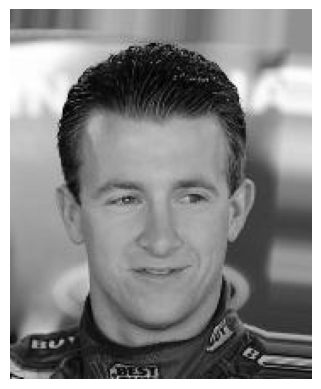

0.5285878777503967


In [26]:
for i_pre in [22]:

    img_path = os.path.join(folder_path, f'{i_pre+1:06d}.jpg')
    img = Image.open(img_path).convert('L')
    transform_tensor = transforms.ToTensor()
    image_tensor = transform_tensor(img)
    f.plot_img_bw(image_tensor)
    plt.show()
    print(f.niveau_gris_BW(image_tensor, taille = 128))

TypeError: tuple indices must be integers or slices, not tuple

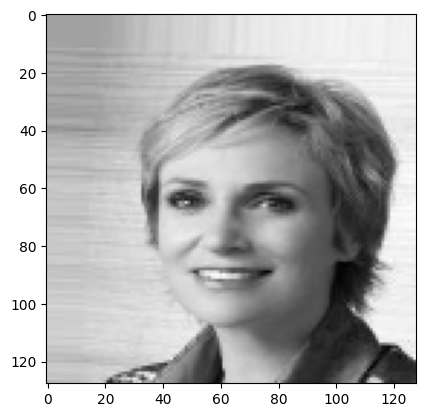

In [9]:
i = 132

pt = selected_dataset_land_bin[i] #train_dataset[i]
plt.imshow(pt[0].squeeze(), cmap = 'gray')
f.niveau_gris_moyen(pt)
plt.axis('off')

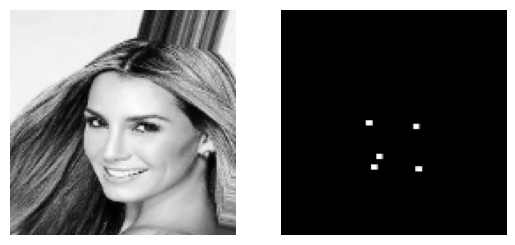

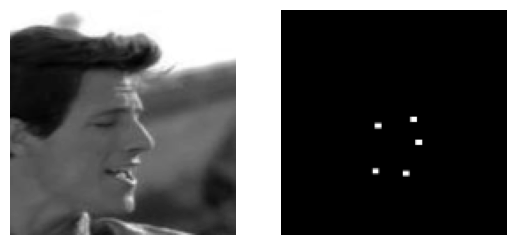

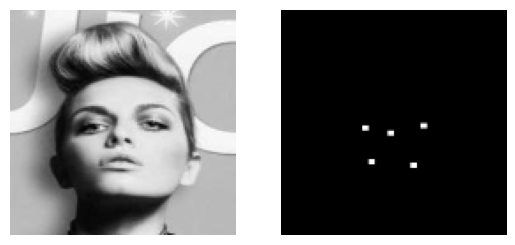

In [11]:
N = 3
for i in range(N):
    pt = selected_dataset_land_bin[i] #train_dataset[i]
    plt.subplot(1,2,1)
    plt.imshow(pt[0].squeeze(), cmap = 'gray')
    plt.axis('off')
    plt.subplot(1,2,2)
    plt.imshow(pt[1].squeeze(), cmap = 'gray')
    plt.axis('off')
    plt.show()

In [12]:
print('indice image')
print(f'{selected_indices[0]+1:06d}.jpg')
# quand on charge que les images
print(selected_dataset_img[0].shape)
print('----------------------')


print('les tailles des trois entrés de chaque pt du dataset : ')
pt = selected_dataset[0]
# quand on charge image / landmarks
print(pt[0].shape) # l'image
print(pt[1].shape) # les landmarks 
print('----------------------')
print('exemple de la liste des landmarks ')
print(pt[1])




indice image
000001.jpg
torch.Size([3, 128, 128])
----------------------
les tailles des trois entrés de chaque pt du dataset : 
torch.Size([3, 218, 178])
(10,)
----------------------
exemple de la liste des landmarks 
[ 69. 109. 106. 113.  77. 142.  73. 152. 108. 154.]


#### Plot images

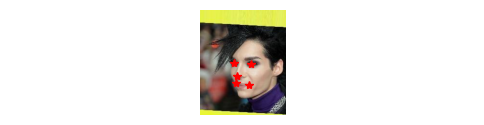

In [13]:
# # Afficher des images du selected_dataset pour vérifier le filtre sur les attributs choisi

def plot_rnd_imgs(n=9):
    nb_cols = int(np.sqrt(n))
    nb_lign = nb_cols+1
    ind_max = len(selected_dataset)
    plt.figure(figsize = (3*nb_lign, 3*nb_cols))
    for i in range(n):
        plt.subplot(nb_lign, nb_cols, i+1)
        k = int(rnd.random()*ind_max)
        f.plot_img(selected_dataset[k][0])


def plot_rnd_imgs_with_landmarks(n=9):
    nb_cols = int(np.sqrt(n))
    nb_lign = nb_cols+1
    ind_max = len(selected_dataset)
    plt.figure(figsize = (3*nb_lign, 3*nb_cols))
    for i in range(n):
        plt.subplot(nb_lign, nb_cols, i+1)
        k = int(rnd.random()*ind_max)
        point = selected_dataset[k]
        img = point[0]
        landmarks = point[1]
        f.plot_img_with_landmarks(img, landmarks)

plot_rnd_imgs_with_landmarks(n=1)

ordre et indices des landmarks : 
$\begin{array}{cccccccccc}
         0 & 1 & 2 & 3 & 4 & 5 & 6 & 7 & 8 & 9  \\
        \text{left eye}_x  & \text{left eye}_y  & \text{right eye}_x &  \text{right eye}_y  & \text{nose}_x  & \text{nose}_y  & \text{left mouth}_x  & \text{left mouth}_y &  \text{right mouth}_x  &  \text{right mouth}_y 
 \end{array}$



Indices scalaires en plus : sourire et orientation

In [14]:

for _ in range(3):
    i = int(500*rnd.random())
    print('orientation : '+str(f.orientation(selected_dataset[i])))
    print('sourire : '+str(f.sourire(selected_dataset[i])))
    print('--------------')

orientation : 0.2777777777777778
sourire : 30.0
--------------
orientation : -0.06666666666666665
sourire : 33.06055050963308
--------------
orientation : -0.4358974358974359
sourire : 27.294688127912362
--------------


In [15]:
# def plot_rnd_imgs_with_landmarks_indices(n=9):
#     nb_cols = int(np.sqrt(n))
#     nb_lign = nb_cols+1
#     ind_max = len(selected_dataset)
#     plt.figure(figsize = (3*nb_lign, 3*nb_cols))
#     for i in range(n):
#         plt.subplot(nb_lign, nb_cols, i+1)
#         k = int(rnd.random()*ind_max)
#         point = selected_dataset[k]
#         img = point[0]
#         landmarks = selected_dataset[k][1]
#         f.plot_img(img)
#         for j in range(0,10,2):
#             plt.plot(landmarks[j],landmarks[j+1], '*', color='r')
#         plt.title('orientation : '+str(int(10000*f.orientation(point))/10000)+' / sourire : '+str(int(f.sourire(selected_dataset[i]))))

# plot_rnd_imgs_with_landmarks_indices()

In [16]:
# N_CENTERS = 4   # for federated learning
# N_ROUNDS = 10   # Nb of iterations between all the centers training and the aggregation process.
   

## Defining a model: Multi-channel Variational Autoencoder
In this excercise we will use the Multi-channel Variational Autoencoder proposed by Antelmi _et_ al.

In [8]:
#!pip install -q git+https://gitlab.inria.fr/epione_ML/mcvae.git

!pip install --upgrade mcvae


[notice] A new release of pip is available: 23.3.1 -> 25.0.1
[notice] To update, run: C:\Users\salvador\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


In [9]:
from mcvae.models import Mcvae

from mcvae.models import VAE
from mcvae.models import ConvVAE, ThreeLayersVAE


                                           uuid  \
index                                             
0      GPU-610199b5-7946-35d1-92ae-e151e2bd5a7a   

                                            name temperature.gpu  \
index                                                              
0      NVIDIA RTX 2000 Ada Generation Laptop GPU              54   

      utilization.gpu memory.used memory.total  
index                                           
0                   0        1454         8188  


## MC VAE 3 cannaux R / G / B

### Parameters

In [ ]:
N_EPOCHS = 500
BATCH_SIZE = 32
LR = 1e-4           # Learning rate
LAT_DIM = 128        # Size of the latent space for this autoencoder
BETA =  0.0001         # balance parameter between ll and kl losses loss = beta*kl - ll
N_CHANNELS = 3

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', DEVICE)
vae_class = [ConvVAE, ConvVAE, ConvVAE] # Architecture of the autoencoder (VAE: three layers of convolution and one linear)

Shape_c_1 = (1,size_img_1, size_img_2) # Number of pixels in an CaelebA image after reshape
Shape_c_2 = (1,size_img_1, size_img_2)
Shape_c_3 = (1,size_img_1, size_img_2)

dummy_data = [torch.zeros(Shape_c_1).to(DEVICE), torch.zeros( Shape_c_2).to(DEVICE), torch.zeros( Shape_c_3).to(DEVICE)]  # Dummy data to initialize the input layer size

Device: cuda


In [ ]:
model = Mcvae(data=dummy_data, 
              n_channels=3,
              n_feats = (Shape_c_1, Shape_c_2, Shape_c_3), 
              lat_dim=LAT_DIM, 
              vaeclass=vae_class,
              beta = BETA).to(DEVICE) # channel 1 : image R, channel 2 : image g,  channel 3 : image b
model.optimizer = torch.optim.Adam(params=model.parameters(), lr=LR)
model.init_loss()
model.init_validation_loss()

### Train 

In [ ]:
# Charger le dataset en filtrant les images selon les indices sélectionnés
selected_dataset = CustomImageLandmarksDataset(image_paths, 
                                               landmarks[selected_indices], 
                                               transform=transforms.ToTensor())
selected_dataset_img = CustomImageDataset(image_paths, transform)

# Diviser le Subset en ensembles d'entraînement et de test (70%  train,  20% validation,  10% test)
train_size = int(0.7 * len(selected_dataset))
valid_size = int(0.2 * len(selected_dataset))
test_size = len(selected_dataset) - train_size - valid_size
train_dataset, valid_dataset, test_dataset = random_split(selected_dataset_img, 
                                                          [train_size, valid_size, test_size])


In [ ]:
# Entrainement du modèle

init_params = model.state_dict()
# Load data in the form of a tensor
#train data
X = f.get_data(train_dataset).to(DEVICE)
model.data = torch.Tensor.reshape(X, shape= (N_CHANNELS, BATCH_SIZE, *Shape_c_1))

#validation data
Y = f.get_data(train_dataset).to(DEVICE)
valid_data_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, BATCH_SIZE, *Shape_c_1))

writer = SummaryWriter()
# Load  parameters and train
model.load_state_dict(init_params)
model.optimize(epochs=N_EPOCHS, data=model.data, validation_data = valid_data_tensor)


====> Epoch:    0/500 (0%)	Loss: 3.562	LL: -3.562	KL: 0.000	LL/KL: -1015288.951
====> Epoch:    5/500 (1%)	Loss: 2.368	LL: -2.368	KL: 0.000	LL/KL: -64038.484
====> Epoch:   10/500 (2%)	Loss: 1.896	LL: -1.896	KL: 0.000	LL/KL: -20069.987
====> Epoch:   15/500 (3%)	Loss: 1.503	LL: -1.501	KL: 0.002	LL/KL: -746.692
====> Epoch:   20/500 (4%)	Loss: 1.237	LL: -1.232	KL: 0.006	LL/KL: -220.343
====> Epoch:   25/500 (5%)	Loss: 1.070	LL: -1.063	KL: 0.007	LL/KL: -145.903
====> Epoch:   30/500 (6%)	Loss: 0.966	LL: -0.954	KL: 0.012	LL/KL: -78.140
====> Epoch:   35/500 (7%)	Loss: 0.885	LL: -0.875	KL: 0.011	LL/KL: -82.734
====> Epoch:   40/500 (8%)	Loss: 0.828	LL: -0.814	KL: 0.014	LL/KL: -56.966
====> Epoch:   45/500 (9%)	Loss: 0.781	LL: -0.769	KL: 0.012	LL/KL: -65.350
====> Epoch:   50/500 (10%)	Loss: 0.749	LL: -0.735	KL: 0.014	LL/KL: -53.026
====> Epoch:   55/500 (11%)	Loss: 0.727	LL: -0.710	KL: 0.016	LL/KL: -43.786
====> Epoch:   60/500 (12%)	Loss: 0.700	LL: -0.686	KL: 0.014	LL/KL: -47.566
====> Ep

In [ ]:
nom_model = f'\MCVAE_RGB_{LAT_DIM}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
torch.save(model, PATH)

In [ ]:
LAT_DIM = 64
nom_model = f'\MCVAE_RGB_{LAT_DIM}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
model_loaded = torch.load(PATH)

In [ ]:
# torch.save(model, r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved\NOM_DU_MODELE')

### Contrôler l'entrainement

In [ ]:
def plot_loss(losses):
    for key in losses.keys():
        plt.plot(losses[key], label = key)
    plt.legend()
    plt.title('loss en fonction des epochs, entrainement sur '+str(train_size)+' sample')

def plot_logloss(losses):
    for key in ['total', 'kl']:
        plt.plot(np.log(np.array(losses[key])), label = 'log ('+key+')')
    plt.plot(-np.log(-np.array(losses['ll'])), label = 'log(-ll loss)')
    plt.legend()
    plt.title('loss en fonction des epochs (échelle log), entrainement sur '+str(train_size)+' sample')

In [ ]:
for key in model.loss.keys():
    plt.plot(model.loss[key], label = 'train '+key)
# for key in model.validation_loss.keys():
#     plt.plot(model.validation_loss[key], '--', label = 'valid '+key)
plt.legend(loc=[1, 0])
plt.title('loss // epochs, '+str(train_size)+' train on samples')

In [ ]:
for key in model.loss.keys():
    plt.plot(np.log(np.array(model.loss[key])), label = 'train '+key)
plt.plot(-np.log(-np.array(model.loss['ll'])), label = 'train -log(-ll loss)')

# for key in ['total', 'kl']:
#     plt.plot(np.log(np.array(model.validation_loss[key])), '--',  label = 'valid '+key)
# plt.plot(-np.log(-np.array(model.validation_loss['ll'])), '--',  label = 'valid -log(-ll loss)')
plt.legend(loc=[1, 0])
plt.title('log loss // epochs, '+str(train_size)+' samples for tain, '+str(valid_size)+' samples for validation ')

### Reconstruire les images

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


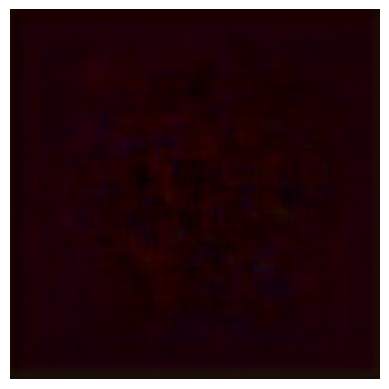

In [ ]:
i = np.random.randint(len(selected_dataset_img))
Y = f.get_data(selected_dataset_img[i]).to(DEVICE)
valid_data_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, 1, 1, size_img_1, size_img_2))

x_hat = model.reconstruct(valid_data_tensor)

x_rec = torch.zeros([3, size_img_1, size_img_2], device='cpu',)
x_rec[0] = x_hat[0]
x_rec[1] = x_hat[1]
x_rec[2] = x_hat[2]

f.plot_img(x_rec)

In [ ]:
# tous les pixels ont la meme scale (vient de la logvar), bizarre....  
# et encore plus bizarre c'est la même pour toutes les images.... 
i = np.random.randint(len(selected_dataset_img))
Y = f.get_data(selected_dataset_img[i]).to(DEVICE)
valid_data_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, 1, 1, size_img_1, size_img_2))

frw = model.forward(valid_data_tensor)
list_of_p = frw['p']

list_of_scales = [[ _.scale for _ in el] for el in list_of_p]

print(list_of_scales)

[[tensor([[[[1.0690, 1.0745, 1.0711,  ..., 1.0759, 1.0794, 1.0791],
          [1.0688, 1.0686, 1.0594,  ..., 1.0667, 1.0761, 1.0741],
          [1.0646, 1.0643, 1.0566,  ..., 1.0740, 1.0821, 1.0738],
          ...,
          [1.0779, 1.0809, 1.0873,  ..., 1.0782, 1.0729, 1.0771],
          [1.0817, 1.0841, 1.0885,  ..., 1.0727, 1.0691, 1.0782],
          [1.0729, 1.0766, 1.0822,  ..., 1.0840, 1.0788, 1.0797]]]],
       device='cuda:0', grad_fn=<PowBackward0>), tensor([[[[1.0691, 1.0744, 1.0709,  ..., 1.0761, 1.0793, 1.0790],
          [1.0690, 1.0687, 1.0592,  ..., 1.0667, 1.0757, 1.0739],
          [1.0647, 1.0642, 1.0565,  ..., 1.0742, 1.0819, 1.0736],
          ...,
          [1.0782, 1.0810, 1.0869,  ..., 1.0778, 1.0730, 1.0773],
          [1.0819, 1.0845, 1.0887,  ..., 1.0729, 1.0692, 1.0783],
          [1.0730, 1.0768, 1.0823,  ..., 1.0834, 1.0786, 1.0796]]]],
       device='cuda:0', grad_fn=<PowBackward0>), tensor([[[[1.0690, 1.0745, 1.0707,  ..., 1.0757, 1.0791, 1.0789],
      

$$\hat{x}_i = \mathbb{E} _j \big[ \mathbb{E}_{q(z| \tilde{x}_j)} [p (x_i|z)] \big] $$

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


TypeError: Invalid shape (128, 128, 2) for image data

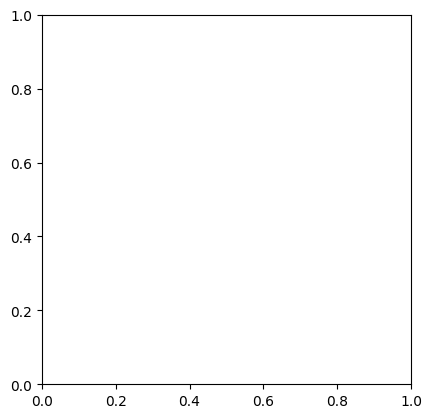

In [ ]:
def reconstruction_image(point_original, model = model_loaded):
    Y = f.get_data(point_original).to(DEVICE)
    valid_data_tensor = torch.Tensor.reshape(Y, shape= (model.n_channels, 1, *Shape_c_1))

    x_hat = model.reconstruct(valid_data_tensor) #renvoie un liste de tenseurs étant

    x_rec = torch.zeros([model.n_channels, size_img_1, size_img_2], device='cpu',)
    for i in range(model.n_channels):
        x_rec[i] = x_hat[i]

    return x_rec


i = 10
f.plot_img(reconstruction_image(train_dataset[i]).detach().numpy())

### Comparaison images

In [ ]:
def plot_img_comp(point_original, model): 

    plt.figure()

    plt.subplot(1,2,1)
    f.plot_img(point_original)
    plt.title('image originale')

    plt.subplot(1,2,2)
    rec_img = reconstruction_image(point_original, model).detach().numpy()
    np.clip(rec_img, 0, 1, out=rec_img)
    f.plot_img(rec_img)
    plt.title('image reconstruite')

with sample from train dataset


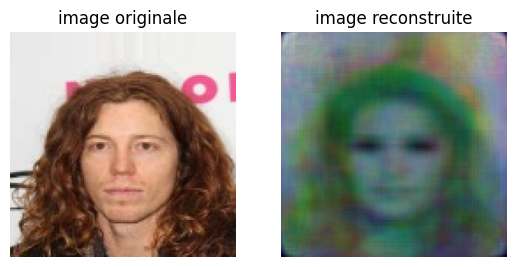

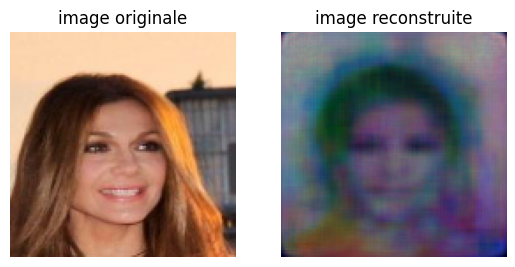

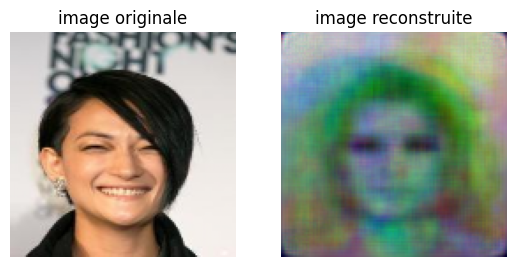

with sample from test dataset


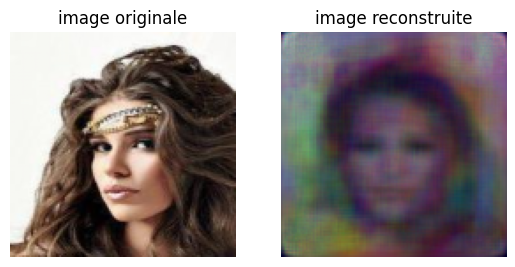

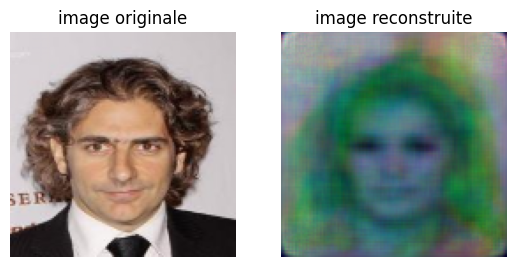

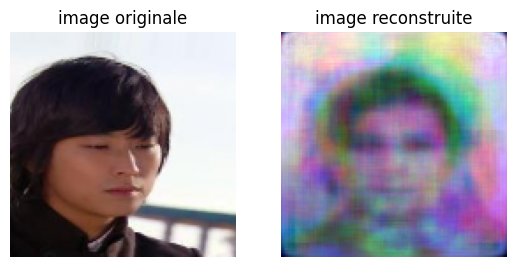

In [ ]:
# plt.figure(figsize = (3,3))
# f.plot_img(s)
# plt.title('image moyenne')

print('with sample from train dataset')
for _ in range(3):
    i = np.random.randint(len(train_dataset))
    point_original = train_dataset[i]
    plot_img_comp(point_original)
    plt.show()

print('with sample from test dataset')
for _ in range(3):
    i = np.random.randint(len(test_dataset))
    point_original = test_dataset[i]

    plot_img_comp(point_original)

### Pairplot espace latent

In [30]:
#on calcule les moyennes des représentations de nb_points 

def calcul_points_pairplot_mccvae(list_ind_point = np.arange(100), data = selected_dataset_land_bin, 
                                  mod = model_loaded):
    chan = mod.n_channels
    lat = mod.lat_dim
    nb_points = len(list_ind_point)
    array_z = np.zeros((nb_points, chan, lat))

    for i, ind in enumerate(list_ind_point):
        Y = f.get_data(data[ind]).to(DEVICE)
        valid_data_tensor = torch.Tensor.reshape(Y, shape= (chan, 1, 1, size_img_1, size_img_2))

        distribs_q = mod.forward(valid_data_tensor)['q']
        for j, q in enumerate(distribs_q) : 
            mu = q.loc.squeeze()
            array_z[i][j] = mu.detach().cpu().numpy()
    return array_z

In [31]:
def kl_norm(n1, n2):
    mu1=n1.loc.squeeze()
    mu2=n2.loc.squeeze()
    s1=n1.scale.squeeze()
    s2=n2.scale.squeeze()
    


In [32]:
def calcul_kl_inter_channel(list_ind_point = np.arange(100), data = selected_dataset_land_bin, 
                                  mod = model_loaded):
    chan = mod.n_channels
    lat = mod.lat_dim
    nb_points = len(list_ind_point)
    array_kl = np.zeros((nb_points, chan, chan))

    for i, ind in enumerate(list_ind_point):
        Y = f.get_data(data[ind]).to(DEVICE)
        valid_data_tensor = torch.Tensor.reshape(Y, shape= (chan, 1, 1, size_img_1, size_img_2))

        distribs_q = mod.forward(valid_data_tensor)['q']
        for j, q in enumerate(distribs_q) :
            for k, r in enumerate(distribs_q):
                array_kl[i][j][k]= kl_divergence(q,r).mean().item()
            
    return array_kl

In [ ]:
nb_points = 500
list_ind_point = rnd.sample(range(0, len(test_dataset)), nb_points)
array_kl = calcul_kl_inter_channel(list_ind_point = list_ind_point, data = test_dataset, mod = model_loaded)

In [ ]:
nb_points = 500
list_ind_point = rnd.sample(range(0, len(test_dataset)), nb_points)
array_z = calcul_points_pairplot_mccvae(list_ind_point = list_ind_point, data = test_dataset, mod = model_loaded)

In [ ]:
list_points_R = []
for i in list_ind_point:
    list_points_R.append( test_dataset[i][0].flatten().numpy()  )

list_points_R = np.array(list_points_R)

list_points_G = []
for i in list_ind_point:
    list_points_G.append( test_dataset[i][1].flatten().numpy()  )

list_points_G = np.array(list_points_G)

list_points_B = []
for i in list_ind_point:
    list_points_B.append( test_dataset[i][2].flatten().numpy()  )

list_points_B = np.array(list_points_B)

In [ ]:
# on choisit selon quel attribut / indice calculé on va colorer les points
indice = f.orientation           # prend en entrée selected_dataset[i]
# indice = f.sourire               # prend en entrée selected_dataset[i]
# indice = f.niveau_gris_moyen       # prend en entrée selected_dataset_img[i]
NB_DIM_PAIR_PLOT = 6
#______________________

indice_color = np.zeros(nb_points)

for i in range(nb_points):
    indice_color[i] = indice(selected_dataset[i])       # changer ici selected_dataset ou selected_dataset_img selon l'indice choisit



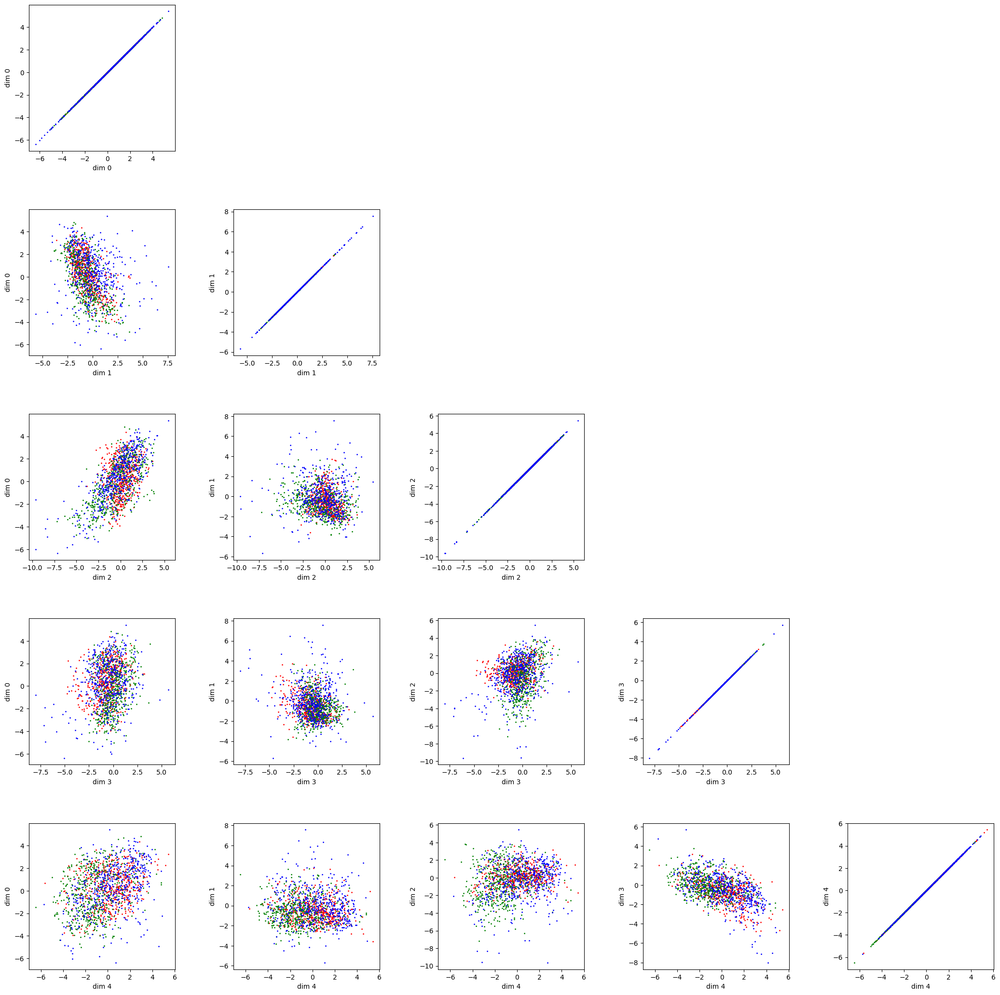

In [ ]:
LIST_DIM_PAIR_PLOT = [0,1,2,3,4]
f.print_pairplot_mcvae(array_z, LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT, 
                     colbar=False)


# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

### Tester alignement

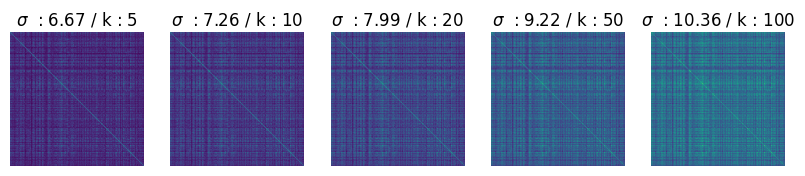

In [ ]:
mat_dist = f.dist_matrix(array_z[:,0,:])
list_k = [5, 10, 20, 50,  100]
N = len(list_k)

plt.figure(figsize=(10, 10*N))
for i, k in enumerate(list_k):
    plt.subplot(1,N,i+1)
    s = f.moy_dist_k_voisin(mat_dist, k=k)
    plt.imshow(f.gauss_norm(mat_dist, sig = s), cmap = 'viridis')
    plt.title('$\sigma$  : '+str(int(s*100)/100)+' / k : '+str(k))
    plt.axis('off')



In [ ]:
mat = np.random.random(size=(5,3))
print(mat) 
print('--')
print(np.sort(mat, axis = 0))

[[0.23395165 0.30104624 0.91049585]
 [0.86346016 0.41849636 0.23310432]
 [0.56354963 0.87587918 0.0870683 ]
 [0.129088   0.44548113 0.93773797]
 [0.56740754 0.97822939 0.60425124]]
--
[[0.129088   0.30104624 0.0870683 ]
 [0.23395165 0.41849636 0.23310432]
 [0.56354963 0.44548113 0.60425124]
 [0.56740754 0.87587918 0.91049585]
 [0.86346016 0.97822939 0.93773797]]


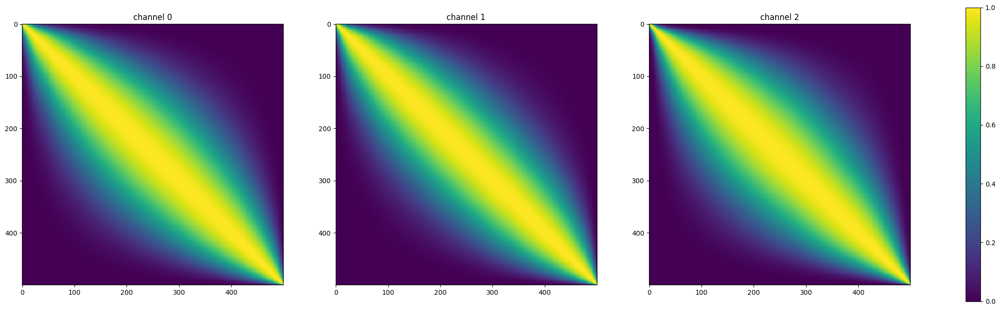

In [ ]:

x = array_z[:,1,:]
# Affichage des matrices d'affinité
_, axes = plt.subplots(1,3,figsize=(10*3,10))

for chan in [0,1,2]:
    plt.subplot(1, 3, chan+1)
    plt.imshow(f.mat_aff_trie(array_z[:,chan,:], kNN = 5), aspect='equal', interpolation='none')
    plt.title('channel '+str(chan))
plt.colorbar(ax=axes,  shrink = 0.8)

In [ ]:

matrice_aff_R = f.mat_aff(array_z[:,0,:], kNN = 5)
matrice_aff_G = f.mat_aff(array_z[:,1,:], kNN = 5)
matrice_aff_B = f.mat_aff(array_z[:,2,:], kNN = 5)

matrice_aff_R_origine = f.mat_aff(list_points_R, kNN = 5)
matrice_aff_G_origine = f.mat_aff(list_points_G, kNN = 5)
matrice_aff_B_origine = f.mat_aff(list_points_B, kNN = 5)

(-0.5, 499.5, 499.5, -0.5)

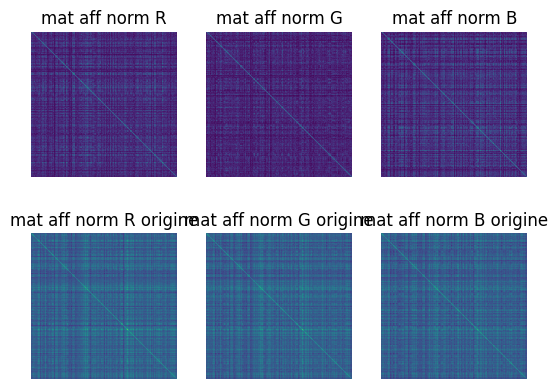

In [ ]:
#plt.figure(figsize=(10*3, 10*2))

plt.subplot(2,3,1)
plt.imshow(matrice_aff_R, cmap = 'viridis')
plt.title('mat aff norm R')
plt.axis('off')

plt.subplot(2,3,2)
plt.imshow(matrice_aff_G, cmap = 'viridis')
plt.title('mat aff norm G')
plt.axis('off')

plt.subplot(2,3,3)
plt.imshow(matrice_aff_B, cmap = 'viridis')
plt.title('mat aff norm B')
plt.axis('off')


plt.subplot(2,3,4)
plt.imshow(matrice_aff_R_origine, cmap = 'viridis')
plt.title('mat aff norm R origine')
plt.axis('off')

plt.subplot(2,3,5)
plt.imshow(matrice_aff_G_origine, cmap = 'viridis')
plt.title('mat aff norm G origine')
plt.axis('off')

plt.subplot(2,3,6)
plt.imshow(matrice_aff_B_origine, cmap = 'viridis')
plt.title('mat aff norm B origine')
plt.axis('off')

In [ ]:
# calculer les coefficienr de corrélation de pearson 
# (cos de l'angle entre les points = 1 ils sont aligné, 0, orthogonaux, -1 opposés)

sts.pearsonr(matrice_aff_R_origine, matrice_aff_R_origine)

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

NameError: name 'matrice_aff_R_origine' is not defined

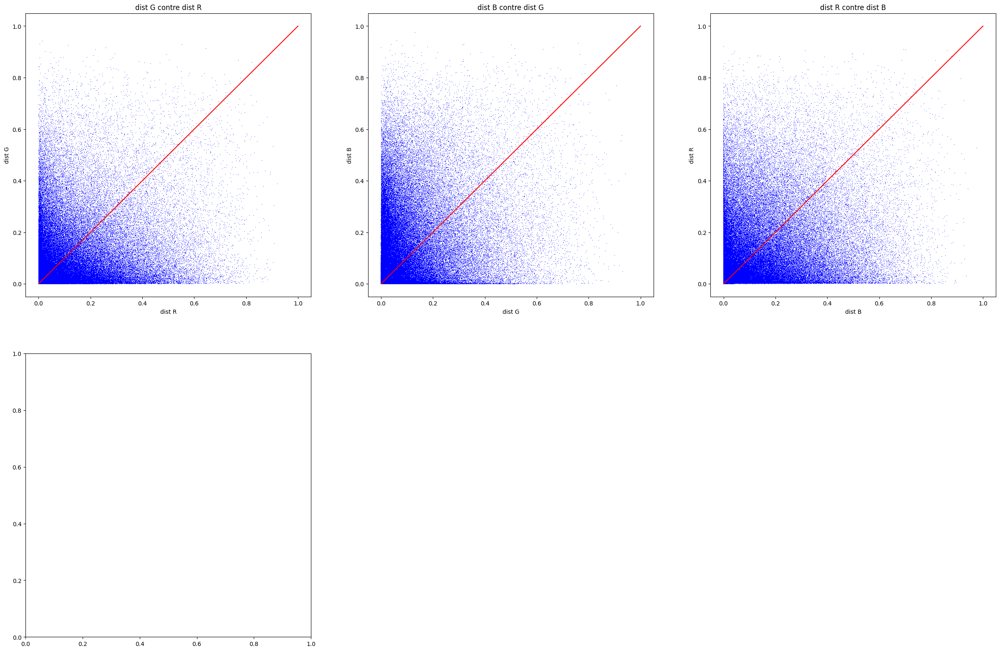

In [ ]:
nb_col = 3
nb_lig = 3
plt.figure(figsize=(10*3, 10*3))

#Z canal i contre Z canal j
plt.subplot(nb_lig,nb_col,1)
f.plot_matx_maty (matrice_aff_R, matrice_aff_G, alpha = .3, title=None, xlab = 'dist R', ylab = 'dist G', color_pt = 'b')

plt.subplot(nb_lig,nb_col,2)
f.plot_matx_maty (matrice_aff_G, matrice_aff_B, alpha = .3, title=None, xlab = 'dist G', ylab = 'dist B', color_pt = 'b')

plt.subplot(nb_lig,nb_col,3)
f.plot_matx_maty (matrice_aff_B, matrice_aff_R, alpha = .3, title=None, xlab = 'dist B', ylab = 'dist R', color_pt = 'b')


# x canal i contre X canal j
plt.subplot(nb_lig,nb_col,4)
f.plot_matx_maty (matrice_aff_R_origine, matrice_aff_G_origine, alpha = .3, title=None, xlab = 'dist R_origine', ylab = 'dist G_origine', color_pt = 'b')

plt.subplot(nb_lig,nb_col,5)
f.plot_matx_maty (matrice_aff_G_origine, matrice_aff_B_origine, alpha = .3, title=None, xlab = 'dist G_origine', ylab = 'dist B_origine', color_pt = 'b')

plt.subplot(nb_lig,nb_col,6)
f.plot_matx_maty (matrice_aff_B_origine, matrice_aff_R_origine, alpha = .3, title=None, xlab = 'dist B_origine', ylab = 'dist R_origine', color_pt = 'b')



#Z canal i contre X canal i
plt.subplot(nb_lig,nb_col,7)
f.plot_matx_maty (matrice_aff_R_origine, matrice_aff_R, alpha = .3, title=None, xlab = 'dist R_origine', ylab = 'dist R lat', color_pt = 'b')

plt.subplot(nb_lig,nb_col,8)
f.plot_matx_maty (matrice_aff_G_origine, matrice_aff_G, alpha = .3, title=None, xlab = 'dist G_origine', ylab = 'dist G lat', color_pt = 'b')

plt.subplot(nb_lig,nb_col,9)
f.plot_matx_maty (matrice_aff_B_origine, matrice_aff_B, alpha = .3, title=None, xlab = 'dist B_origine', ylab = 'dist B lat', color_pt = 'b')

## MC VAE Image/landmarks (image bin)

### Paramètres

In [104]:
N_EPOCHS = 500
BATCH_SIZE = 32
LR = 1e-4           # Learning rate
LAT_DIM = 128       # Size of the latent space for this autoencoder
BETA =  0.00001         # balance parameter between ll and kl losses loss = beta*kl - ll
N_CHANNELS = 2

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', DEVICE)
VAE_CLASSES = [ConvVAE, ConvVAE] # Architecture of the autoencoder (VAE: three layers of convolution and one linear)

Shape_c_1 = (1, size_img_1, size_img_2) # Number of pixels in an CaelebA image after reshape
Shape_c_2 = (1, size_img_1, size_img_2) #Image binaire des landmarks

dummy_data = [torch.zeros(Shape_c_1).to(DEVICE), torch.zeros( Shape_c_2).to(DEVICE)]  # Dummy data to initialize the input layer size


model_land_bin = Mcvae(data=dummy_data, 
              n_channels=N_CHANNELS,
              n_feats = (Shape_c_1, Shape_c_2), 
              lat_dim=LAT_DIM, 
              vaeclass=VAE_CLASSES,
              beta = BETA).to(DEVICE) # channel 1 : image, channel 2 : image binaire des landmarks
model_land_bin.optimizer = torch.optim.Adam(params=model_land_bin.parameters(), lr=LR)
model_land_bin.init_loss()
model_land_bin.init_validation_loss()


# Charger le dataset en filtrant les images selon les indices sélectionnés
selected_dataset = CustomImageLandmarksDataset(image_paths, landmarks[selected_indices], transform=transforms.ToTensor())
selected_dataset_land_bin = CustomImageLandmarksBinaryDataset(image_paths, 
                                                  landmarks[selected_indices], 
                                                  transform=transform,
                                                  transform_land=transform_land)

# Diviser le Subset en ensembles d'entraînement et de test (70%  train,  20% validation,  10% test)
train_size = int(0.7 * len(selected_dataset_land_bin))
valid_size = int(0.2 * len(selected_dataset_land_bin))
test_size = len(selected_dataset_land_bin) - train_size - valid_size
train_dataset, valid_dataset, test_dataset = random_split(selected_dataset_land_bin, 
                                                          [train_size, valid_size, test_size])

# Utiliser un DataLoader pour charger les données en lots
train_data_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
test_data_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)

Device: cuda


### Entrainement


In [20]:
X = f.get_data(train_dataset, batch_size=BATCH_SIZE)#.to(DEVICE)
print(len(X))
print('----')
print(X[0].shape)
print(X[1].shape)




2
----
torch.Size([32, 1, 128, 128])
torch.Size([32, 1, 128, 128])


C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [ ]:
# Entrainement du modèle

init_params = model_land_bin.state_dict()
# Load data in the form of a tensor
#train data
X = f.get_data(train_dataset, batch_size=BATCH_SIZE)#.to(DEVICE)
AA = torch.empty(size= (N_CHANNELS, BATCH_SIZE, *Shape_c_1))
AA[0] = X[0]
AA[1] = X[1]
model_land_bin.data = AA.to(DEVICE) #torch.Tensor.reshape(X, shape= (N_CHANNELS, BATCH_SIZE, 1, *Shape_c_1, *Shape_c_2))

#validation data
Y = f.get_data(train_dataset, batch_size=BATCH_SIZE)#.to(DEVICE)
valid_data_tensor = Y #torch.Tensor.reshape(Y, shape= (N_CHANNELS, BATCH_SIZE, 1, size_img_1, size_img_2))

writer = SummaryWriter()
# Load  parameters and train
model_land_bin.load_state_dict(init_params)
model_land_bin.optimize(epochs=N_EPOCHS, data=model_land_bin.data, validation_data = valid_data_tensor)

====> Epoch:    0/500 (0%)	Loss: 1.484	LL: -1.484	KL: 0.000	LL/KL: -5180912.958
====> Epoch:    5/500 (1%)	Loss: 0.846	LL: -0.846	KL: 0.000	LL/KL: -243977.979
====> Epoch:   10/500 (2%)	Loss: 0.639	LL: -0.639	KL: 0.000	LL/KL: -88634.183
====> Epoch:   15/500 (3%)	Loss: 0.501	LL: -0.501	KL: 0.000	LL/KL: -4453.346
====> Epoch:   20/500 (4%)	Loss: 0.399	LL: -0.398	KL: 0.001	LL/KL: -643.373
====> Epoch:   25/500 (5%)	Loss: 0.321	LL: -0.320	KL: 0.001	LL/KL: -295.214
====> Epoch:   30/500 (6%)	Loss: 0.272	LL: -0.269	KL: 0.003	LL/KL: -103.731
====> Epoch:   35/500 (7%)	Loss: 0.242	LL: -0.239	KL: 0.003	LL/KL: -81.463
====> Epoch:   40/500 (8%)	Loss: 0.216	LL: -0.212	KL: 0.004	LL/KL: -56.526
====> Epoch:   45/500 (9%)	Loss: 0.202	LL: -0.198	KL: 0.004	LL/KL: -47.056
====> Epoch:   50/500 (10%)	Loss: 0.188	LL: -0.184	KL: 0.004	LL/KL: -45.831
====> Epoch:   55/500 (11%)	Loss: 0.181	LL: -0.177	KL: 0.004	LL/KL: -40.476
====> Epoch:   60/500 (12%)	Loss: 0.174	LL: -0.170	KL: 0.004	LL/KL: -40.303
====>

In [ ]:
nom_model = f'\MC_VAE_BW_Land_2chan_{LAT_DIM}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
torch.save(model_land_bin, PATH)

In [105]:
LAT_DIM = 128

nom_model = f'\MC_VAE_BW_Land_2chan_{LAT_DIM}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
model_loaded = torch.load(PATH)

### Reconstruire les images

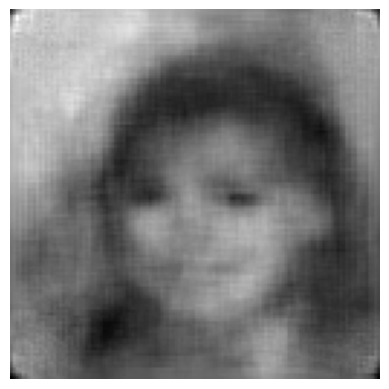

In [22]:
i = np.random.randint(len(selected_dataset_img))
Y = f.get_data(selected_dataset_land_bin[i]).to(DEVICE)
Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, 1, 1, size_img_1, size_img_2))

x_hat = model_loaded.reconstruct(Y_tensor)

x_rec = torch.zeros([1, size_img_1, size_img_2], device='cpu',)
x_rec[0] = x_hat[0]

f.plot_img_bw(x_rec)

In [23]:
def reconstruction_image_bw_land(point_original):
    Y = f.get_data(point_original).to(DEVICE)
    Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, 1, 1, size_img_1, size_img_2))

    x_hat = model_loaded.reconstruct(Y_tensor) #renvoie un liste de tenseurs étant

    x_rec = torch.zeros([1, size_img_1, size_img_2], device='cpu',)
    x_rec[0] = x_hat[0]

    return x_rec


def reconstruction_land(point_original):
    Y = f.get_data(point_original).to(DEVICE)
    Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, 1, 1, size_img_1, size_img_2))

    x_hat = model_loaded.reconstruct(Y_tensor) #renvoie un liste de tenseurs étant

    x_rec = torch.zeros([1, size_img_1, size_img_2], device='cpu',)
    x_rec[0] = x_hat[1]

    return x_rec

i = 1
# f.plot_img(reconstruction_image_bw_land(selected_dataset_land_bin[i]).detach().numpy())

In [15]:
   

def plot_img_comp_land(point_original): 

    plt.figure()

    plt.subplot(1,2,1)
    f.plot_img_bw(point_original[1])
    plt.title('original picture')

    plt.subplot(1,2,2)
    rec_img = reconstruction_land(point_original).detach().numpy()
    np.clip(rec_img[0], 0, 1, out=rec_img)
    f.plot_img_bw(rec_img)
    plt.title('reconstruction')
    


In [33]:
# plt.figure(figsize = (3,3))
# f.plot_img(s)
# plt.title('image moyenne')
N = 1
print('with sample from train dataset')
for _ in range(N):
    i = np.random.randint(len(train_dataset))
    point_original = train_dataset[i]
    f.plot_img_comp(point_original)
    f.plot_img_comp_land(point_original)
    plt.show()

print('with sample from test dataset')
for _ in range(N):
    i = np.random.randint(len(test_dataset))
    point_original = test_dataset[i]

    f.plot_img_comp(point_original)
    f.plot_img_comp_land(point_original)

with sample from train dataset


C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


AttributeError: module 'fonctions_utiles' has no attribute 'plot_img_comp'

### Pairplot espace latent

In [106]:
#on calcule les moyennes des représentations de nb_points 


nb_points = 500
list_ind_point = rnd.sample(range(0, len(test_dataset)), nb_points)
array_z_bw = calcul_points_pairplot_mccvae(list_ind_point = list_ind_point, data = selected_dataset_land_bin, mod = model_loaded)

C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


In [107]:
list_points_img = []
for i in list_ind_point:
    list_points_img.append( test_dataset[i][0].flatten().numpy()  )

list_points_img = np.array(list_points_img)

list_points_land = []
for i in list_ind_point:
    list_points_land.append( test_dataset[i][1].flatten().numpy()  )

list_points_land = np.array(list_points_land)

In [108]:
# on choisit selon quel attribut / indice calculé on va colorer les points
indice = f.orientation           # prend en entrée selected_dataset[i]
# indice = f.sourire               # prend en entrée selected_dataset[i]
# indice = f.niveau_gris_moyen       # prend en entrée selected_dataset_img[i]
#______________________

indice_color = np.zeros(nb_points)

for i in range(nb_points):
    indice_color[i] = indice(selected_dataset[i])       # changer ici selected_dataset ou selected_dataset_img selon l'indice choisit


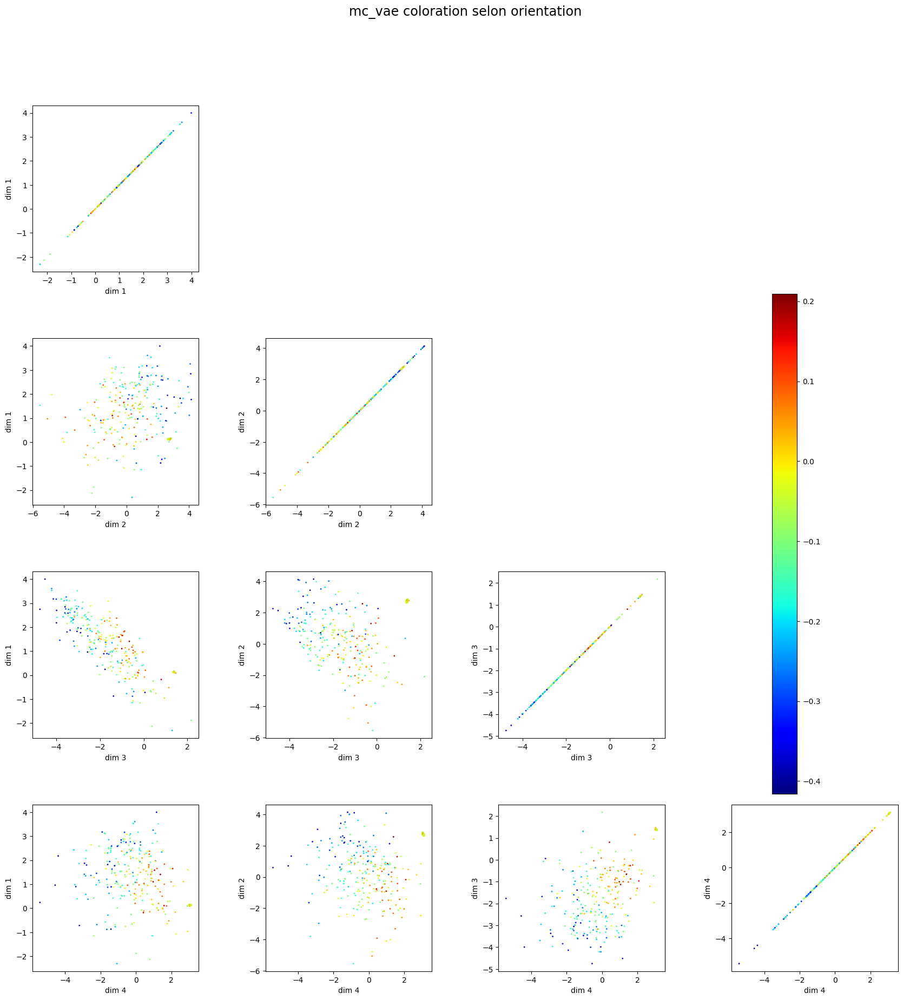

In [119]:
LIST_DIM_PAIR_PLOT = [1, 2, 3, 4]

f.print_pairplot_mcvae(array_z_bw, LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT, 
                       indice_color=indice_color, indice = f.orientation, 
                       alpha = .3)


# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

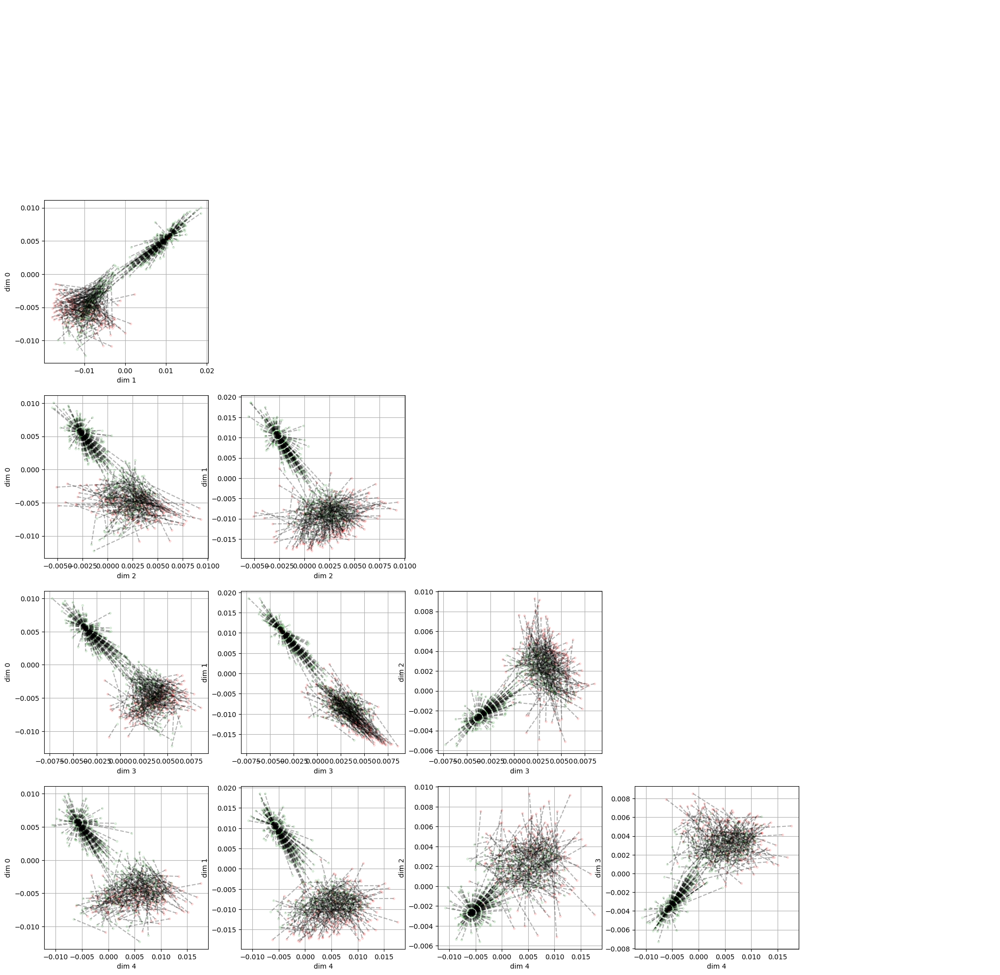

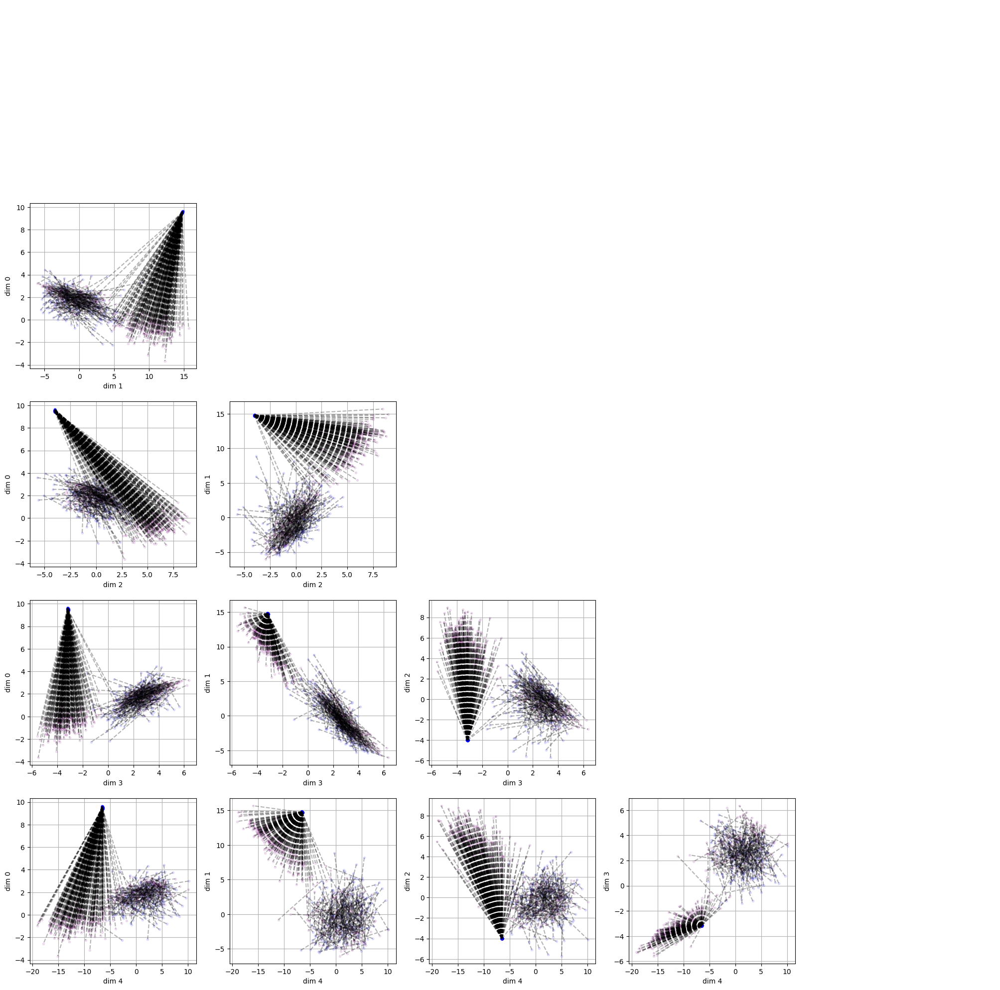

In [ ]:
alpha_pt = .4

channel_i = 0
channel_j = 1
LIST_DIM_PAIR_PLOT = [0, 1, 2, 3, 4]


z_proc_img, z_proc_noise, d = procrustes(array_z_bw[:,channel_i,:], array_z_bw[:,channel_j,:])

f.print_pairplot_align_relie(z_proc_img, z_proc_noise, 
                             LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT,
                             colx='r',
                             coly='g',
                             alpha_pt=.1,
                             alpha_lien=.3)

f.print_pairplot_align_relie(array_z_bw[:,channel_i,:], array_z_bw[:,channel_j,:], 
                             LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT,
                             colx='b',
                             coly='purple',
                             alpha_pt=.1,
                             alpha_lien=.3 )

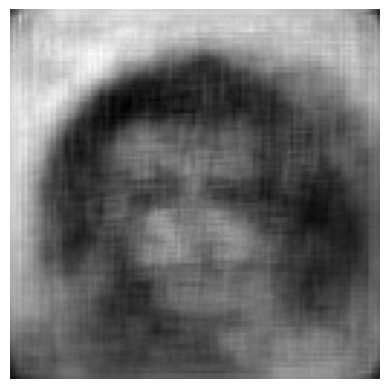

In [ ]:
point_acc = np.array([np.median(array_z_bw[:,0,i]) for i in range(LAT_DIM)])

Z_lat = torch.from_numpy(np.array([point_acc, point_acc]))
Z_lat = Z_lat.reshape(2,1,64).to(DEVICE).float()

p = model_loaded.decode(Z_lat) #renvoie un liste de tenseurs étant


x_hat = []
for c in range(N_CHANNELS):
    if c in range(N_CHANNELS):
        # mean along the stacking direction
        x_tmp = torch.stack([p[c][e].loc.detach() for e in range(N_CHANNELS)]).mean(0)
        x_hat.append(x_tmp)
        del x_tmp
    else:
        x_hat.append(None)

f.plot_img_bw(x_hat[0].cpu().numpy())

quantile 0 : 0.2456032972407808
quantile 0.1 : 0.4182430631061824
quantile 0.5 : 0.8469263163380429
quantile 0.51 : 1.0708105349509334
quantile 0.52 : 28.9901959413134
quantile 1 : 50.92543220985299


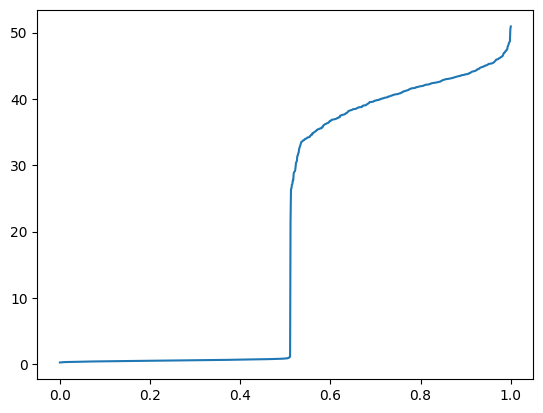

In [ ]:
dist_pt_acc = np.array([np.linalg.norm(point_acc - array_z_bw[i][0]) for i in range(len(array_z_bw))])

list_quantiles = np.linspace(0,1,1000)
plt.plot(list_quantiles, np.quantile(dist_pt_acc, list_quantiles))

for q in [0, .1, .5, .51, .52, 1]:
    print(f'quantile {q} : '+ str(np.quantile(dist_pt_acc, q)))

In [ ]:
eps = .5
ind_points_suspects = []

for i, i_data in enumerate(list_ind_point):
    if np.linalg.norm(point_acc - array_z_bw[i][0]) < eps:
        ind_points_suspects.append(i_data)
    
print(f'nombre de pt suspects : {len(ind_points_suspects)} sur {len(list_ind_point)} points au total')



nombre de pt suspects : 204 sur 1000 points au total


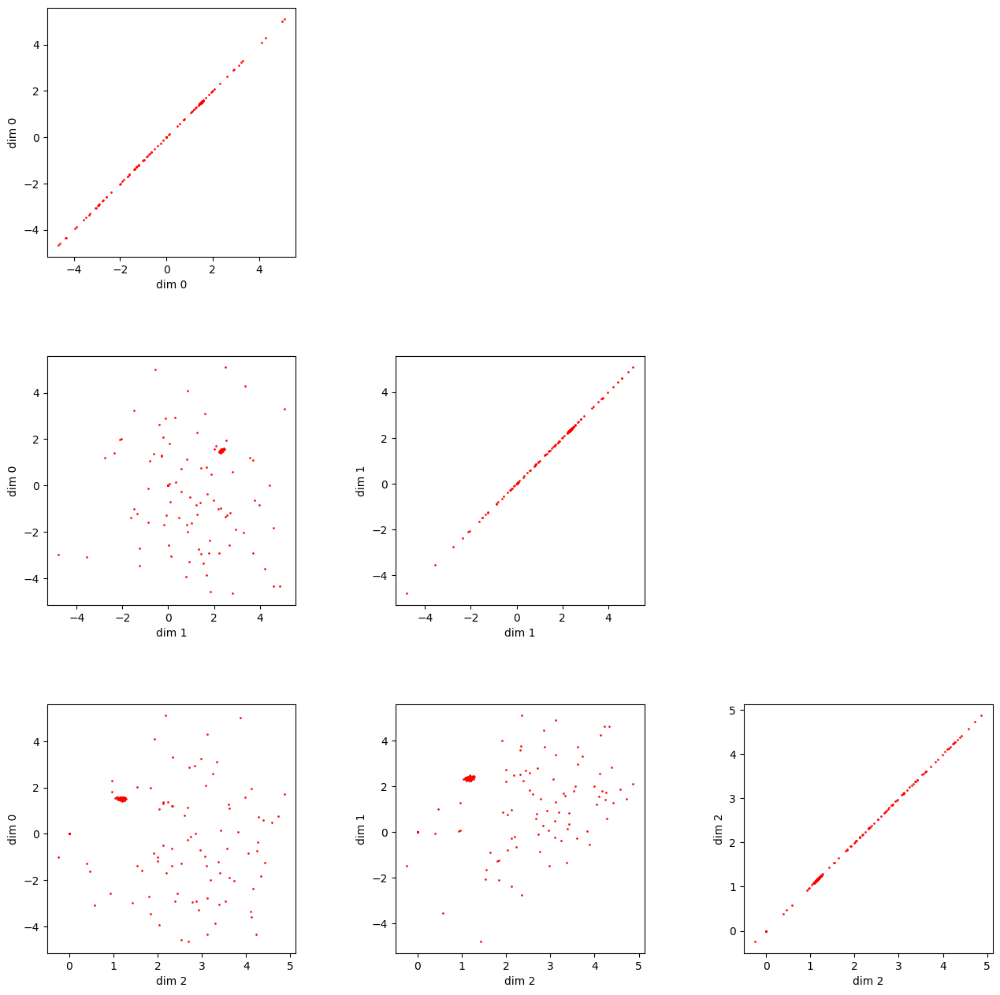

In [ ]:
array_z_suspects = calcul_points_pairplot_mccvae(list_ind_point = ind_points_suspects, data = test_dataset, mod = model_loaded)

LIST_DIM_PAIR_PLOT = [0,1,2]

f.print_pairplot_mcvae(array_z_suspects, LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT, 
                     colbar=False, alpha = .9, channels = [0])


# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

### Tester alignement

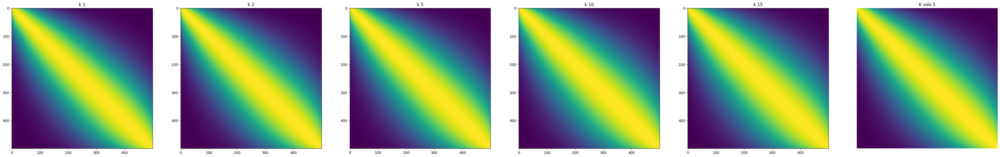

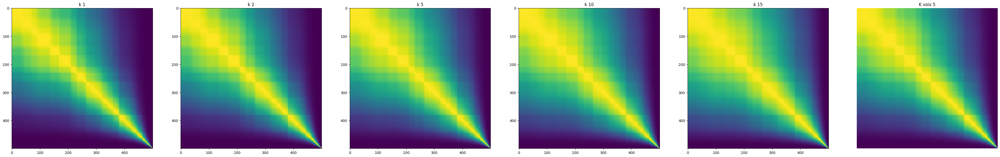

In [ ]:
list_k = [1,2,5,10,15]
N = len(list_k)
n_lig = 1
n_col = N+1

plt.figure(figsize=(10*N, 10*2))
for i, k in enumerate(list_k):
        plt.subplot(n_lig, n_col,i+1 )
        plt.imshow(f.mat_aff_trie(list_points_img, kNN = k), aspect='equal', interpolation='none')
        plt.title('k '+str(k))

plt.subplot(n_lig, n_col, N+1)
plt.imshow(f.mat_aff_trie(list_points_img, kNN = 5), cmap = 'viridis')
plt.title('K vois 5')#+' / k : '+str(k))
plt.axis('off')
plt.show()


list_k = [1,2,5,10,15]
N = len(list_k)
n_lig = 1
n_col = N+1

plt.figure(figsize=(10*N, 10*2))
for i, k in enumerate(list_k):
        plt.subplot(n_lig, n_col,i+1 )
        plt.imshow(f.mat_aff_trie(list_points_land, kNN = k), aspect='equal', interpolation='none')
        plt.title('k '+str(k))

plt.subplot(n_lig, n_col, N+1)
plt.imshow(f.mat_aff_trie(list_points_land, kNN = 5), cmap = 'viridis')
plt.title('K vois 5')#+' / k : '+str(k))
plt.axis('off')
plt.show()

In [ ]:

for i,pts in [(0,list_points_img), (1,list_points_land)]:
    plt.subplot(n_lig, n_col, i+3)
    plt.imshow(f.mat_aff_trie(pts, kNN = 2), aspect='equal', interpolation='none')
    plt.title('origine channel '+str(i))

In [ ]:
nb_pt = 200
matrice_aff_img  = f.mat_aff(array_z_bw[:,0,:], kNN = 5)
matrice_aff_land = f.mat_aff(array_z_bw[:,1,:], kNN = 5)


matrice_aff_img_origine  = f.mat_aff(list_points_img, kNN = 5)
matrice_aff_land_origine = f.mat_aff(list_points_land, kNN = 5)

(-0.5, 499.5, 499.5, -0.5)

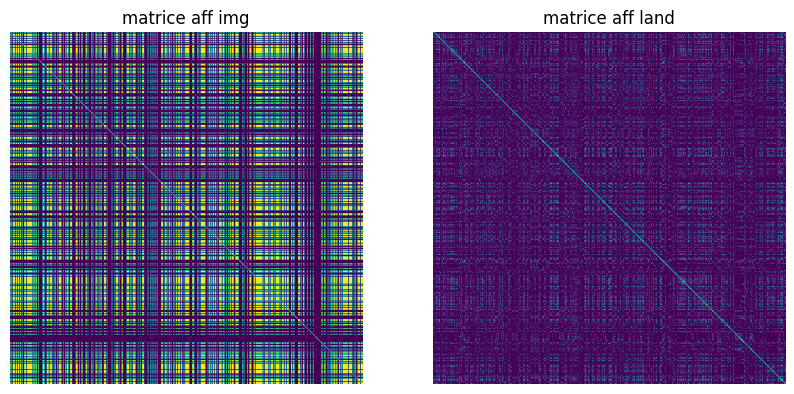

In [ ]:
plt.figure(figsize=(10, 10*3))

plt.subplot(1,2,1)
plt.imshow(matrice_aff_img, cmap = 'viridis')
plt.title('matrice aff img')
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(matrice_aff_land, cmap = 'viridis')
plt.title('matrice aff land')
plt.axis('off')



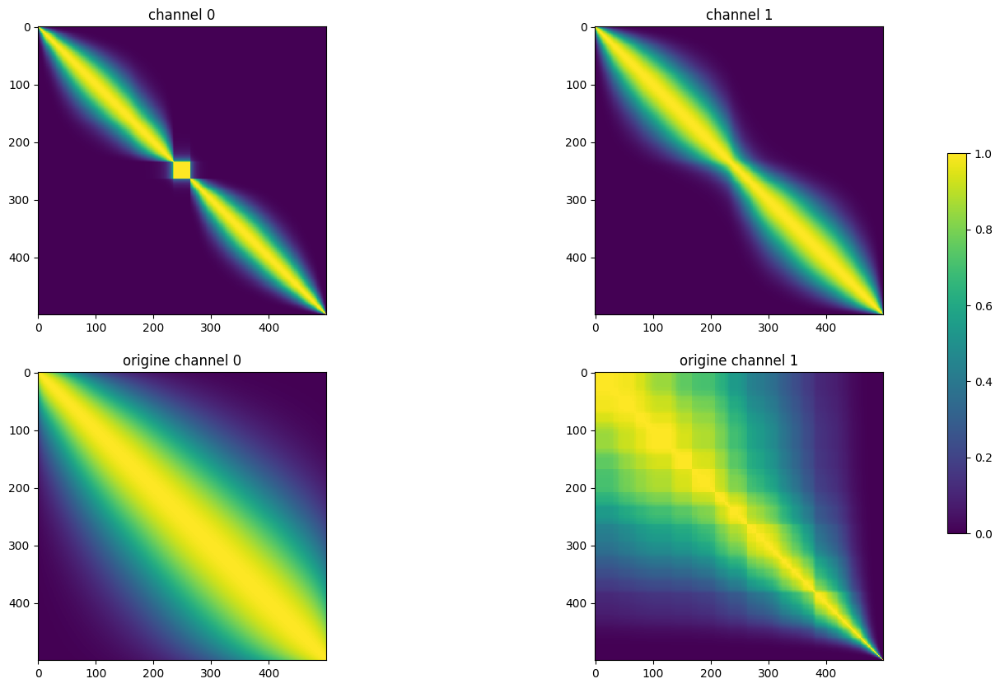

In [ ]:

x = array_z_bw[:,0,:]
# Affichage des matrices d'affinité
n_lig = 2
n_col = 2
fig, axes = plt.subplots(n_lig,n_col,figsize=(10*2,10))


for chan in [0,1]:
    plt.subplot(n_lig, n_col, chan+1)
    plt.imshow(f.mat_aff_trie(array_z_bw[:,chan,:], kNN = 5), aspect='equal', interpolation='none')
    plt.title('channel '+str(chan))

for i,pts in [(0,list_points_img), (1,list_points_land)]:
    plt.subplot(n_lig, n_col, i+3)
    plt.imshow(f.mat_aff_trie(pts, kNN = 2), aspect='equal', interpolation='none')
    plt.title('origine channel '+str(i))

plt.colorbar(ax=axes,  shrink = 0.6)

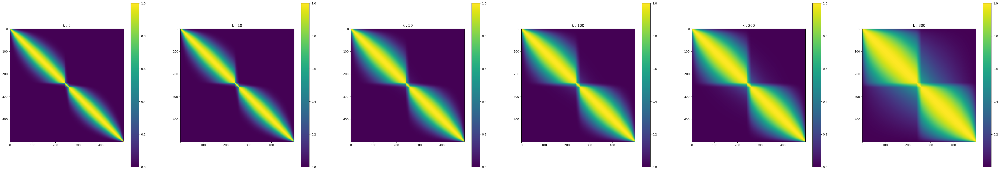

In [ ]:
x = array_z_bw[:,0,:]
# Affichage des matrices d'affinité
list_k = [5, 10, 50, 100, 200, 300]
N = len(list_k)
plt.figure(figsize=(10*N,10))

chan = 0
i=1
for k in list_k:
    plt.subplot(1, N, i)
    i+=1
    plt.imshow(f.mat_aff_trie(array_z_bw[:,chan,:], kNN = k), aspect='equal', interpolation='none')
    plt.colorbar()
    plt.title('k : '+str(k))

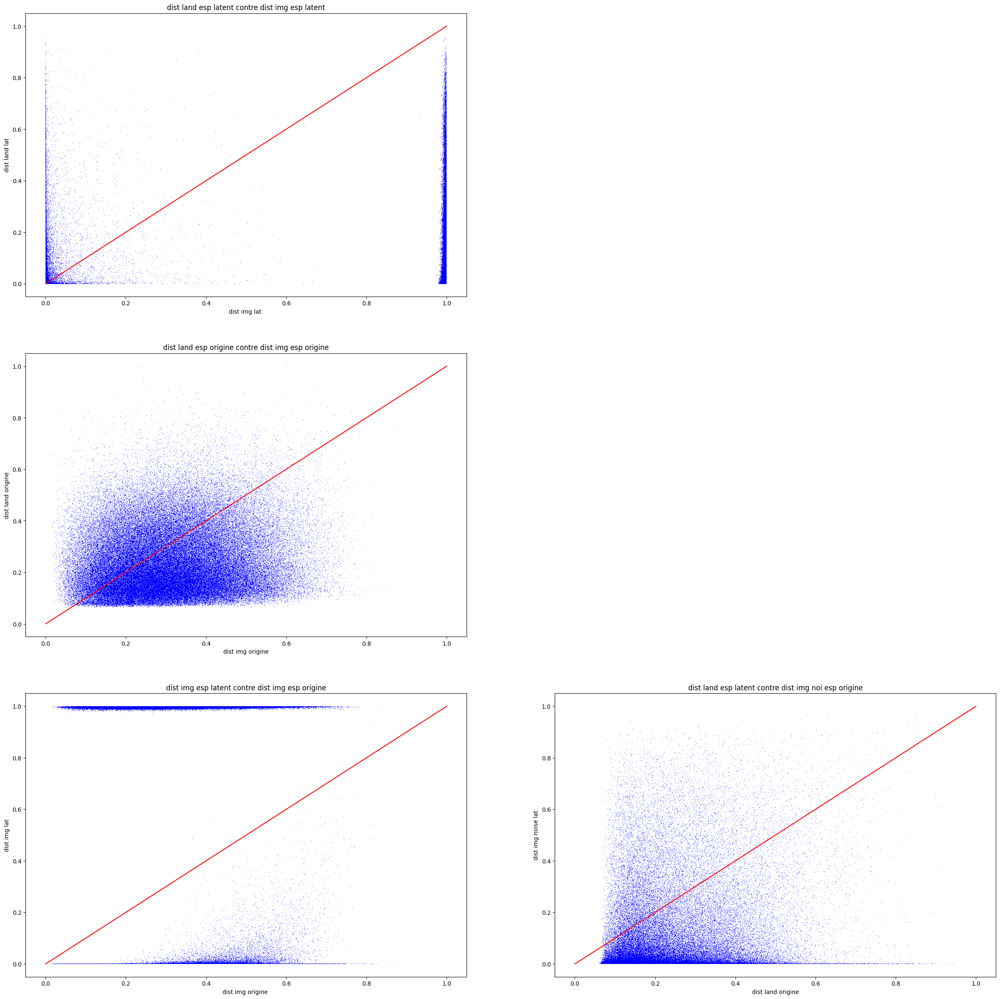

In [ ]:
nb_col = 2
nb_lig = 3
plt.figure(figsize=(10*3, 10*3))

#Z canal i contre Z canal j
plt.subplot(nb_lig,nb_col,1)
f.plot_matx_maty (matrice_aff_img, matrice_aff_land, 
                title='dist land esp latent contre dist img esp latent', 
                xlab = 'dist img lat ', ylab = 'dist land lat', color_pt = 'b')



# X canal i contre X canal j
plt.subplot(nb_lig,nb_col,3)
f.plot_matx_maty (matrice_aff_img_origine, matrice_aff_land_origine, 
                title='dist land esp origine contre dist img esp origine',
                xlab = 'dist img origine', ylab = 'dist land origine', color_pt = 'b')



#Z canal i contre X canal i
plt.subplot(nb_lig,nb_col,5)
f.plot_matx_maty (matrice_aff_img_origine, matrice_aff_img, 
                title='dist img esp latent contre dist img esp origine', 
                xlab = 'dist img origine ', ylab = 'dist img lat', color_pt = 'b')

plt.subplot(nb_lig,nb_col,6)
f.plot_matx_maty (matrice_aff_land_origine, matrice_aff_land, 
                title='dist land esp latent contre dist img noi esp origine', 
                xlab = 'dist land origine', ylab = 'dist img noise lat', color_pt = 'b')

In [ ]:
alpha_pt = .4

channel_i = 0
channel_j = 1
LIST_DIM_PAIR_PLOT = [0, 1, 2, 3, 4]


z_proc_img, z_proc_noise, d = procrustes(array_z_noise[:,channel_i,:], array_z_noise[:,channel_j,:])

f.print_pairplot_align_relie(z_proc_img, z_proc_noise, 
                             LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT,
                             colx='r',
                             coly='g',
                             alpha_pt=.1,
                             alpha_lien=.3)

f.print_pairplot_align_relie(array_z_noise[:,channel_i,:], array_z_noise[:,channel_j,:], 
                             LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT,
                             colx='b',
                             coly='purple',
                             alpha_pt=.1,
                             alpha_lien=.3 )
d

### Meilleur vs Pire

In [110]:
def list_losses(data = test_dataset, 
                model = model_land_bin, 
                n_fil_in = 1, nb_pt = None):
    loss = model.loss_function
    l = []
    # for el in data:
    #     Y = f.get_data(el).to(DEVICE)
    #     Y_tensor = torch.Tensor.reshape(Y, shape= (1, n_fil_in, size_img_1, size_img_2))
    #     pt_loss = loss(model.forward(Y_tensor))['total'].mean()
    #     l.append(pt_loss)
    #     del Y, Y_tensor, pt_loss
    # return l
    if nb_pt is None : 
        nb_pt = len(data)
    for i in range(nb_pt):
        Y = f.get_data(data[i]).to(DEVICE)
        Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, n_fil_in , *Shape_c_1))
        pt_loss = loss(model.forward(Y_tensor))['total'].mean().item()
        l.append(pt_loss)
        del Y, Y_tensor, pt_loss
    return l

def best_recons(data = test_dataset, data_land = None, model = model_land_bin, n_fil_in = 1):
    loss = model.loss_function
    
    #initialisation 
    Y = f.get_data(data[0]).to(DEVICE)
    Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, n_fil_in , *Shape_c_1))
    frw = model.forward(Y_tensor)
    pt_loss = loss(frw)['total'].mean().item()
    l = pt_loss
    
    for el in data:
        Y = f.get_data(el).to(DEVICE)
        Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, n_fil_in , *Shape_c_1))
        frw = model.forward(Y_tensor)
        pt_loss = loss(frw)['total'].mean().item()
        if pt_loss < l :
            l = pt_loss
            point = el
        del Y, Y_tensor, frw, pt_loss
    recons = reconstruction_image_bw_land(point)
    if data_land is not None:
        recons_land = reconstruction_land(point)
    else : 
        recons_land = 'not demanded'
    ret = {'el' : point,
           'recons': recons,
           'recons_land': recons_land}
    return ret


def best_and_worst_recons(data = test_dataset, 
                          model = model_land_bin,n = 5, 
                          n_fil_in = 1, 
                          data_land = None,
                          list_loss = None):
    if list_loss is None : 
        indexed_l = list(enumerate(list_losses(data = test_dataset, 
                                               model = model, 
                                               n_fil_in = n_fil_in)))
    else : 
        indexed_l = list(enumerate(list_loss))
    sorted_indexed_l = sorted(indexed_l, key=lambda x: x[1], reverse=False)
    
    #on récupère les indices puis les reconstrutions des n meilleurs : loss les plus petites
    top_best_n_indices = [i for i, _ in sorted_indexed_l[:n]]
    list_recons_best = []
    list_recons_best_land = []
    for i in top_best_n_indices:
        list_recons_best.append(reconstruction_image_bw_land(data[i]))
        if data_land is not None : 
            list_recons_best_land.append(reconstruction_land(data_land[i]))


    #on récupère les indices puis les reconstrutions des n pires : loss les plus grandes
    top_worst_n_indices = [i for i, _ in sorted_indexed_l[-n:]]
    list_recons_worst = []
    list_recons_worst_land = []
    for i in top_worst_n_indices:
        list_recons_worst.append(reconstruction_image_bw_land(data[i]))
        if data_land is not None : 
            list_recons_worst_land.append(reconstruction_land(data_land[i]))
    ret = {
        'best' : list_recons_best,
        'worst' :  list_recons_worst,
        'list_indice_best' : top_best_n_indices,
        'list_indice_worst' : top_worst_n_indices,
        'best_land' : list_recons_best_land,
        'worst_land' :  list_recons_worst_land,
    }

    return ret




In [111]:
list_loss = list_losses(data = test_dataset, 
                        model = model_loaded,
                        n_fil_in=1,
                        nb_pt = 500) 


min : 0.05614171922206879
max : 1.9306846857070923
moyenne : 0.7501788541898131
------
quantile 0.25 : 0.14678486064076424
quantile 0.5 : 0.8951119780540466
quantile 0.75 : 1.287049949169159
------
moyenne norm : 0.3594772052141496
quantile 0.25 : 0.046948702752825935
quantile 0.5 : 0.43454545687490864
quantile 0.75 : 0.6375501080313813


Text(0.5, 1.0, 'losses on the test dataset MC-VAE img//land')

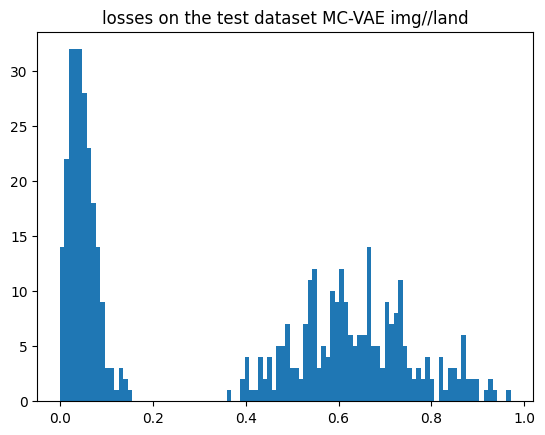

In [112]:
def info_list(l, quant=[0.25, 0.5, 0.75], ret_norm = False):
    a = np.array(l)
    m = a.min()
    ma = a.max()
    print(f'min : {m}')
    print(f'max : {ma}')
    print(f'moyenne : {a.mean()}')
    print('------')
    for q in quant:
        print(f'quantile {q} : {np.quantile(a, q)}')
    print('------')
    if ret_norm:
        no = (a-m)/ma
        print(f'moyenne norm : {no.mean()}')
        for q in quant:
            print(f'quantile {q} : {np.quantile(no, q)}')
        return no


l_norm = info_list(list_loss, ret_norm =True)
plt.hist(l_norm, bins=100)
plt.title('losses on the test dataset MC-VAE img//land')

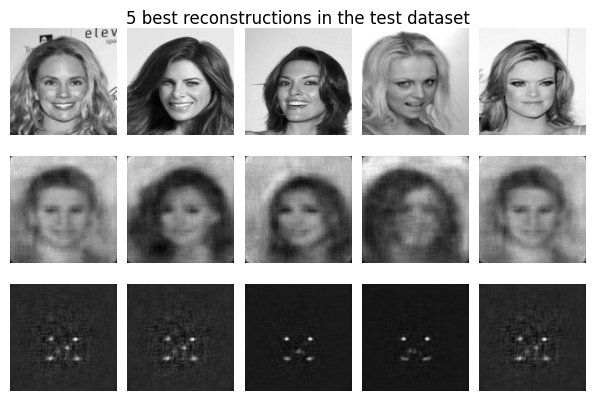

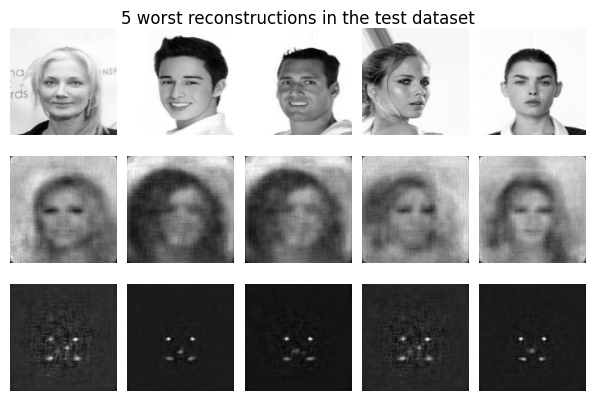

In [113]:
N = 5

b_and_w_recons = best_and_worst_recons(data = test_dataset, 
                                       model = model_loaded,
                                       data_land = selected_dataset_land_bin,
                                       n = N, 
                                       n_fil_in = 1, 
                                       list_loss = list_loss)
dict  = b_and_w_recons
b_recons =  dict['best']
w_recons =  dict['worst']
b_recons_land =  dict['best_land']
w_recons_land =  dict['worst_land']
ind_b_recons =  dict['list_indice_best']
ind_w_recons =  dict['list_indice_worst']


for i in range(N):
    plt.subplot(3, N, i+1)
    f.plot_img_bw(test_dataset[ind_b_recons[i]][0])

    plt.subplot(3, N, N+i+1)
    f.plot_img_bw(b_recons[i])

    plt.subplot(3, N, 2*N+i+1)
    f.plot_img_bw(b_recons_land[i])
    
plt.suptitle(str(N)+' best reconstructions in the test dataset', 
                verticalalignment = 'bottom', )
# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=1, bottom=0.2, wspace=0.1, hspace=0)
plt.show()


for i in range(N):
    plt.subplot(3, N, i+1)
    f.plot_img_bw(test_dataset[ind_w_recons[i]][0])

    plt.subplot(3, N, N+i+1)
    f.plot_img_bw(w_recons[i])

    
    plt.subplot(3, N, 2*N+i+1)
    f.plot_img_bw(w_recons_land[i])
    
plt.suptitle(str(N)+' worst reconstructions in the test dataset', 
                verticalalignment = 'bottom', )

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=1, bottom=0.2, wspace=0.1, hspace=0)

In [ ]:
LIST_DIM_PAIR_PLOT=[0,1,2,3,4,5]
N = 20

b_and_w_recons = best_and_worst_recons(data = test_dataset,
                                        model = model_loaded,
                                        n = N, 
                                        n_fil_in = 1, 
                                        list_loss = list_loss)
dict  = b_and_w_recons
ind_b_recons =  dict['list_indice_best']
ind_w_recons =  dict['list_indice_worst']

best_points_bw = calcul_points_pairplot_mccvae(list_ind_point = ind_b_recons, 
                                     mod = model_loaded, 
                                     data = test_dataset)

worst_points_bw = calcul_points_pairplot_mccvae(list_ind_point = ind_w_recons, 
                                     mod = model_loaded, 
                                     data = test_dataset)

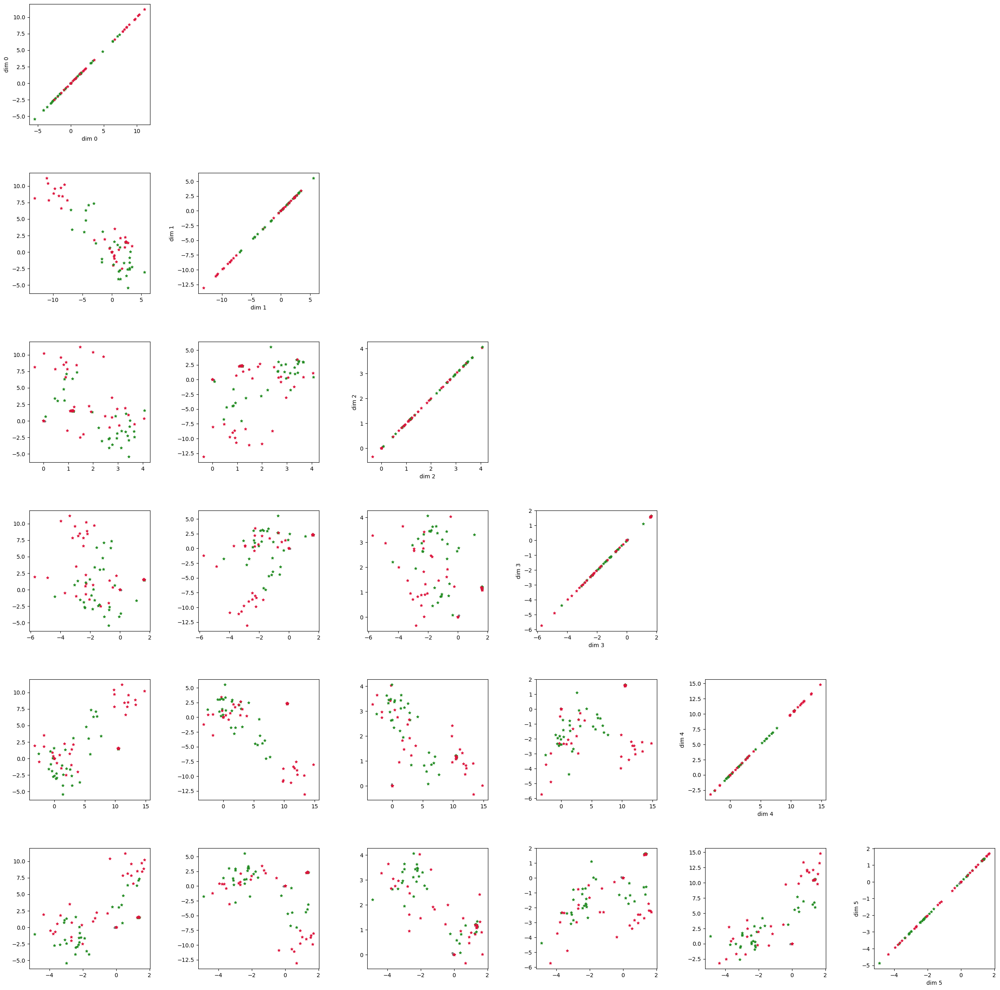

In [ ]:
f.print_pairplot_mcvae(array_z, LIST_DIM_PAIR_PLOT, 
               best_points=best_points_bw, 
               col_best = 'forestgreen',
               worst_points=worst_points_bw,
               col_worst = 'crimson',
               alpha = 0.2)

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

## MC VAE Image/Image bruitee

### Paramètres

In [10]:
N_EPOCHS = 500
BATCH_SIZE = 32
LR = 1e-4           # Learning rate
LAT_DIM = 32        # Size of the latent space for this autoencoder
BETA =  0.00001         # balance parameter between ll and kl losses loss = beta*kl - ll
N_CHANNELS = 2

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', DEVICE)
VAE_CLASSES = [ConvVAE, ConvVAE] # Architecture of the autoencoder (VAE: three layers of convolution and one linear)

Shape_c_1 = (1, size_img_1, size_img_2) # Number of pixels in an CaelebA image after reshape
Shape_c_2 = (1, size_img_1, size_img_2) #Image binaire des landmarks

dummy_data = [torch.zeros(Shape_c_1).to(DEVICE), torch.zeros( Shape_c_2).to(DEVICE)]  # Dummy data to initialize the input layer size


model_noise = Mcvae(data=dummy_data, 
              n_channels=N_CHANNELS,
              n_feats = (Shape_c_1, Shape_c_2), 
              lat_dim=LAT_DIM, 
              vaeclass=VAE_CLASSES,
              beta = BETA).to(DEVICE) # channel 1 : image, channel 2 : image binaire des landmarks
model_noise.optimizer = torch.optim.Adam(params=model_noise.parameters(), lr=LR)
model_noise.init_loss()
model_noise.init_validation_loss()



Device: cuda


In [11]:
NOISE_LEVEL = .1

# Charger le dataset en filtrant les images selon les indices sélectionnés
selected_dataset = CustomImageLandmarksDataset(image_paths, landmarks[selected_indices], transform=transforms.ToTensor())
selected_dataset_noise = CustomImageNoisedDataset(image_paths, 
                                                  transform=transform,
                                                  noise = NOISE_LEVEL)

# Diviser le Subset en ensembles d'entraînement et de test (70%  train,  20% validation,  10% test)
train_size = int(0.7 * len(selected_dataset_noise))
valid_size = int(0.2 * len(selected_dataset_noise))
test_size = len(selected_dataset_noise) - train_size - valid_size
train_dataset, valid_dataset, test_dataset = random_split(selected_dataset_noise, 
                                                          [train_size, valid_size, test_size])

# Utiliser un DataLoader pour charger les données en lots
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

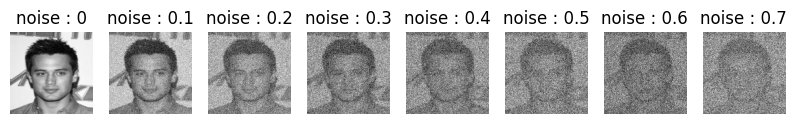

In [41]:
# test des niveau de bruit
list_noise_level = [0, .1, .2, .3, .4, .5, .6, .7]
j = 4
plt.figure(figsize = (10, 10*len(list_noise_level)))

for i, noise in enumerate(list_noise_level):
    plt.subplot(1, len(list_noise_level), i+1)
    selected_dataset_noise_test = CustomImageNoisedDataset(image_paths, 
                                                  transform=transform,
                                                  noise = noise)
    f.plot_img_bw(selected_dataset_noise_test[j][1])
    plt.title(f'noise : {noise}')
plt.show()


### Entrainement


In [ ]:
# Entrainement du modèle

init_params = model_noise.state_dict()
# Load data in the form of a tensor
#train data
X = f.get_data(train_dataset, batch_size=BATCH_SIZE)#.to(DEVICE)
AA = torch.empty(size= (N_CHANNELS, BATCH_SIZE, *Shape_c_1))
AA[0] = X[0]
AA[1] = X[1]
model_noise.data = AA.to(DEVICE) #torch.Tensor.reshape(X, shape= (N_CHANNELS, BATCH_SIZE, 1, *Shape_c_1, *Shape_c_2))

#validation data
Y = f.get_data(train_dataset, batch_size=BATCH_SIZE)#.to(DEVICE)
valid_data_tensor = Y #torch.Tensor.reshape(Y, shape= (N_CHANNELS, BATCH_SIZE, 1, size_img_1, size_img_2))

writer = SummaryWriter()
# Load  parameters and train
model_noise.load_state_dict(init_params)
model_noise.optimize(epochs=N_EPOCHS, data=model_noise.data, validation_data = valid_data_tensor)

====> Epoch:    0/500 (0%)	Loss: 1.786	LL: -1.786	KL: 0.000	LL/KL: -21499020.890
====> Epoch:    5/500 (1%)	Loss: 1.182	LL: -1.182	KL: 0.000	LL/KL: -68713.173
====> Epoch:   10/500 (2%)	Loss: 0.895	LL: -0.895	KL: 0.000	LL/KL: -19603.948
====> Epoch:   15/500 (3%)	Loss: 0.720	LL: -0.720	KL: 0.000	LL/KL: -5704.560
====> Epoch:   20/500 (4%)	Loss: 0.598	LL: -0.598	KL: 0.000	LL/KL: -2421.905
====> Epoch:   25/500 (5%)	Loss: 0.514	LL: -0.514	KL: 0.001	LL/KL: -848.770
====> Epoch:   30/500 (6%)	Loss: 0.447	LL: -0.446	KL: 0.001	LL/KL: -522.597
====> Epoch:   35/500 (7%)	Loss: 0.405	LL: -0.404	KL: 0.001	LL/KL: -289.086
====> Epoch:   40/500 (8%)	Loss: 0.371	LL: -0.369	KL: 0.002	LL/KL: -199.505
====> Epoch:   45/500 (9%)	Loss: 0.349	LL: -0.346	KL: 0.002	LL/KL: -146.244
====> Epoch:   50/500 (10%)	Loss: 0.328	LL: -0.326	KL: 0.003	LL/KL: -129.432
====> Epoch:   55/500 (11%)	Loss: 0.312	LL: -0.309	KL: 0.003	LL/KL: -103.587
====> Epoch:   60/500 (12%)	Loss: 0.303	LL: -0.301	KL: 0.003	LL/KL: -102.45

In [ ]:
nom_model = f'\MC_VAE_{NOISE_LEVEL}noise_2chan_{LAT_DIM}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
torch.save(model_noise, PATH)

In [12]:
LAT_DIM = 64
NOISE_LEVEL = .1

nom_model = nom_model = f'\MC_VAE_{NOISE_LEVEL}noise_2chan_{LAT_DIM}lat'
PATH = r'C:\Users\salvador\Documents\VSCode\mcVAE_CelebA\models_saved'+nom_model
model_loaded = torch.load(PATH)

### Reconstruire les images

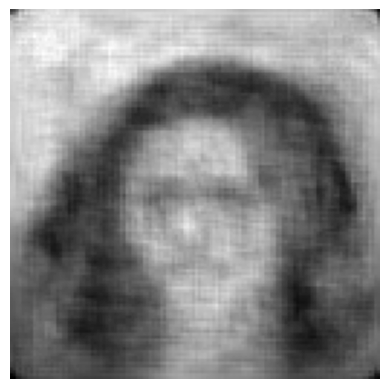

In [43]:
i = np.random.randint(len(selected_dataset_img))
Y = f.get_data(selected_dataset_noise[i]).to(DEVICE)
Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, 1, 1, size_img_1, size_img_2))

x_hat = model_loaded.reconstruct(Y_tensor)

x_rec = torch.zeros([1, size_img_1, size_img_2], device='cpu',)
x_rec[0] = x_hat[0]

f.plot_img_bw(x_rec)

In [13]:
def reconstruction_image_bw_land(point_original):
    Y = f.get_data(point_original).to(DEVICE)
    Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, 1, 1, size_img_1, size_img_2))

    x_hat = model_loaded.reconstruct(Y_tensor) #renvoie un liste de tenseurs étant

    x_rec = torch.zeros([1, size_img_1, size_img_2], device='cpu',)
    x_rec[0] = x_hat[0]

    return x_rec


def reconstruction_land(point_original):
    Y = f.get_data(point_original).to(DEVICE)
    Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, 1, 1, size_img_1, size_img_2))

    x_hat = model_loaded.reconstruct(Y_tensor) #renvoie un liste de tenseurs étant

    x_rec = torch.zeros([1, size_img_1, size_img_2], device='cpu',)
    x_rec[0] = x_hat[1]

    return x_rec

i = 1
# f.plot_img(reconstruction_image_bw_land(selected_dataset_land_bin[i]).detach().numpy())

with sample from train dataset


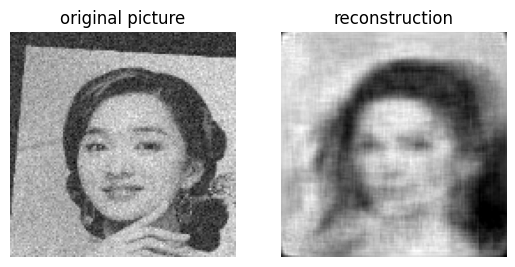

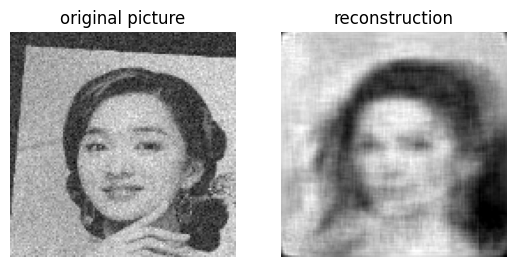

with sample from test dataset


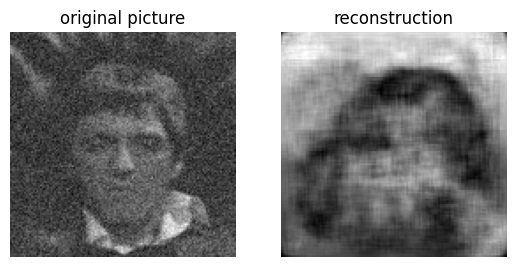

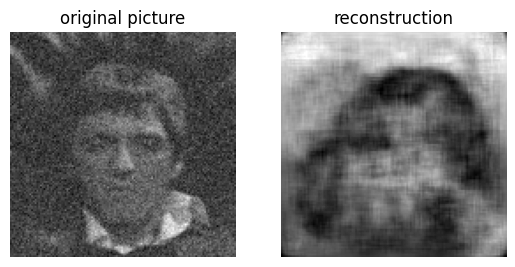

In [16]:
# plt.figure(figsize = (3,3))
# f.plot_img(s)
# plt.title('image moyenne')
N = 1
print('with sample from train dataset')
for _ in range(N):
    i = np.random.randint(len(train_dataset))
    point_original = train_dataset[i]
    plot_img_comp_land(point_original)
    plot_img_comp_land(point_original)
    plt.show()

print('with sample from test dataset')
for _ in range(N):
    i = np.random.randint(len(test_dataset))
    point_original = test_dataset[i]

    plot_img_comp_land(point_original)
    plot_img_comp_land(point_original)

### Pairplot espace latent

In [17]:
#on calcule les moyennes des représentations de nb_points 

def calcul_points_pairplot_mccvae(list_ind_point = np.arange(100), 
                                  data = selected_dataset, 
                                  mod = model_loaded):
    chan = mod.n_channels
    lat = mod.lat_dim
    array_z = np.zeros((nb_points, chan, lat))

    for i, ind in enumerate(list_ind_point):
        Y = f.get_data(data[ind]).to(DEVICE)
        valid_data_tensor = torch.Tensor.reshape(Y, shape= (chan, 1, 1, size_img_1, size_img_2))

        distribs_q = mod.forward(valid_data_tensor)['q']
        for j, q in enumerate(distribs_q) : 
            mu = q.loc.squeeze()
            array_z[i][j] = mu.detach().cpu().numpy()
    return array_z


In [19]:
nb_points = 500
list_ind_point = rnd.sample(range(0, len(test_dataset)), nb_points)
array_z_noise = calcul_points_pairplot_mccvae(list_ind_point = list_ind_point, data = selected_dataset_noise, mod = model_loaded)


In [20]:
list_points = []
for i in list_ind_point:
    list_points.append( test_dataset[i][0].flatten().numpy()  )

list_points = np.array(list_points)

list_points_noise = []
for i in list_ind_point:
    list_points_noise.append( test_dataset[i][1].flatten().numpy()  )

list_points_noise = np.array(list_points_noise)

In [28]:
# on choisit selon quel attribut / indice calculé on va colorer les points
# indice = f.orientation           # prend en entrée selected_dataset[i]
indice = f.sourire               # prend en entrée selected_dataset[i]
# indice = f.niveau_gris_moyen       # prend en entrée selected_dataset_img[i]
#______________________

indice_color = np.zeros(nb_points)

for i in range(nb_points):
    indice_color[i] = indice(selected_dataset[i])       # changer ici selected_dataset ou selected_dataset_img selon l'indice choisit


In [29]:
from sklearn.cross_decomposition import PLSRegression

numDimsToPlot = 10

### TODO: create a PLS model with numDimsToPlot components
pls = PLSRegression(n_components=numDimsToPlot)

### TODO: fit the model
pls.fit(array_z_noise[:,0].squeeze(), indice_color)


PLSRegression(n_components=10)

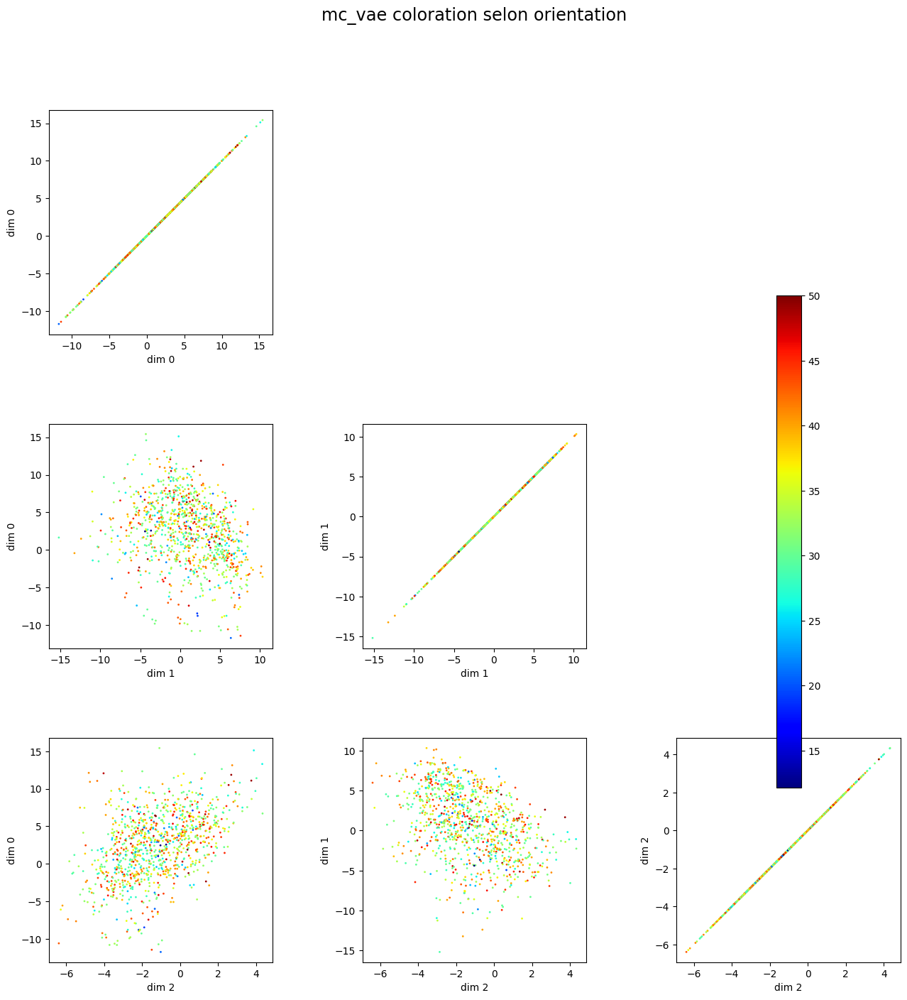

In [30]:
LIST_DIM_PAIR_PLOT = [0, 1, 2]

f.print_pairplot_mcvae(array_z_noise, LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT, 
                     indice_color=indice_color, indice = f.orientation)

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

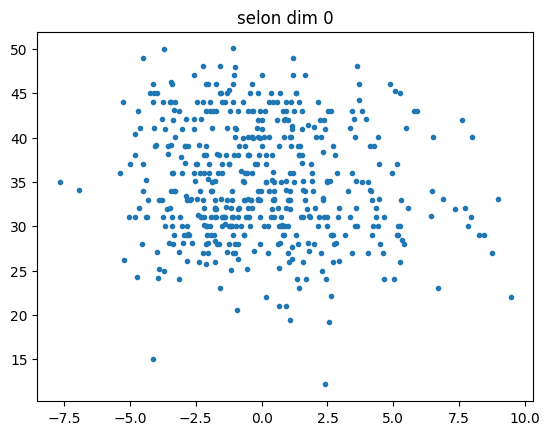

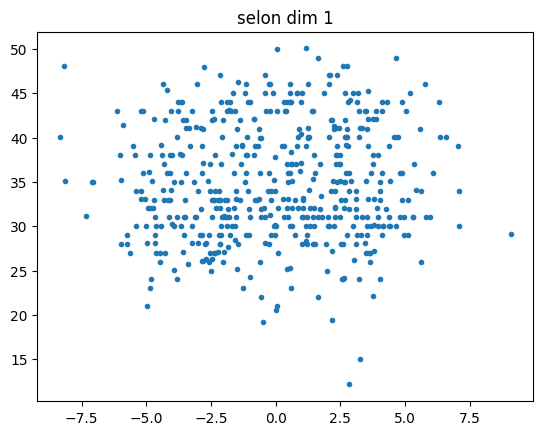

In [33]:
for i in range(2):
    plt.plot(pls.x_scores_[:,i], indice_color, '.')
    plt.title(f'selon dim {i}')
    plt.show()

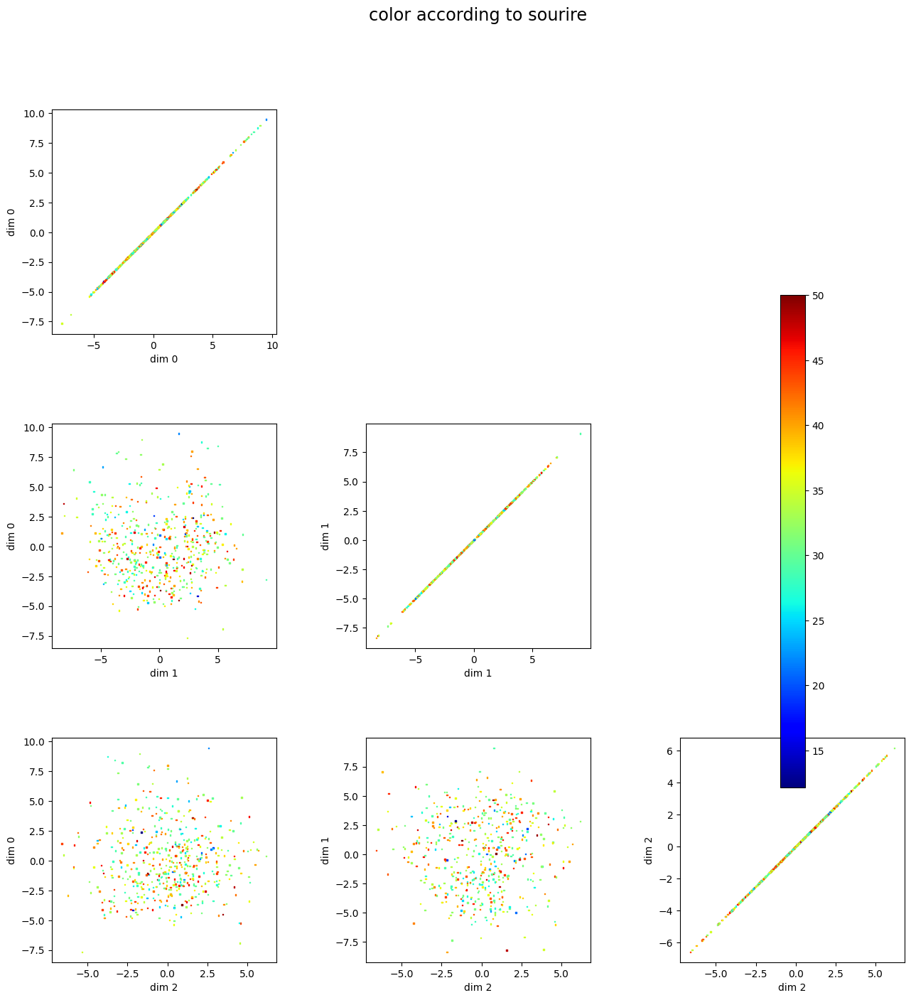

In [32]:
LIST_DIM_PAIR_PLOT = [0, 1, 2]

f.print_pairplot(pls.x_scores_, LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT, 
                     indice_color=indice_color, indice = f.sourire)

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

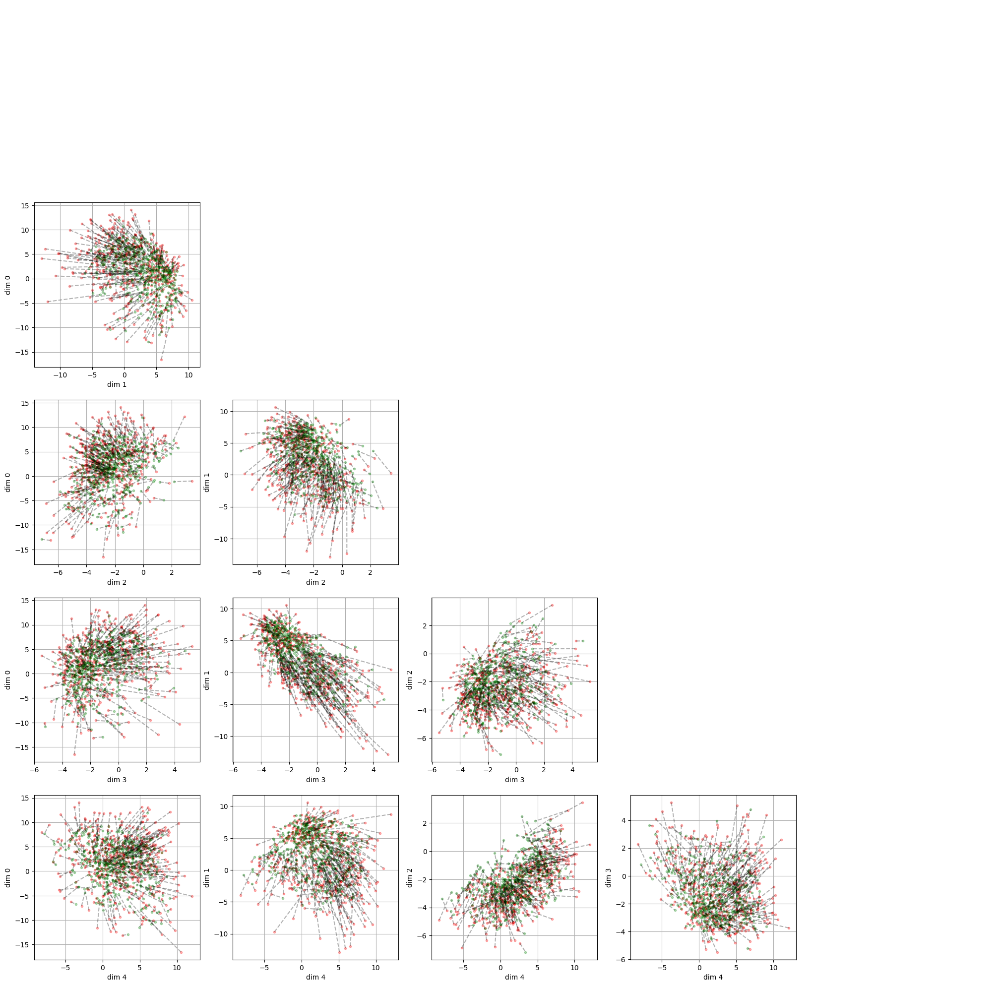

In [ ]:

alpha_pt = .4

channel_i = 0
channel_j = 1
LIST_DIM_PAIR_PLOT = [0, 1, 2, 3, 4]
f.print_pairplot_align_relie(array_z_noise[:,channel_i,:], array_z_noise[:,channel_j,:], 
                             LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT,
                             colx='r',
                             coly='g',
                             alpha_pt=.3,
                             alpha_lien=.3)


0.10918617574962489

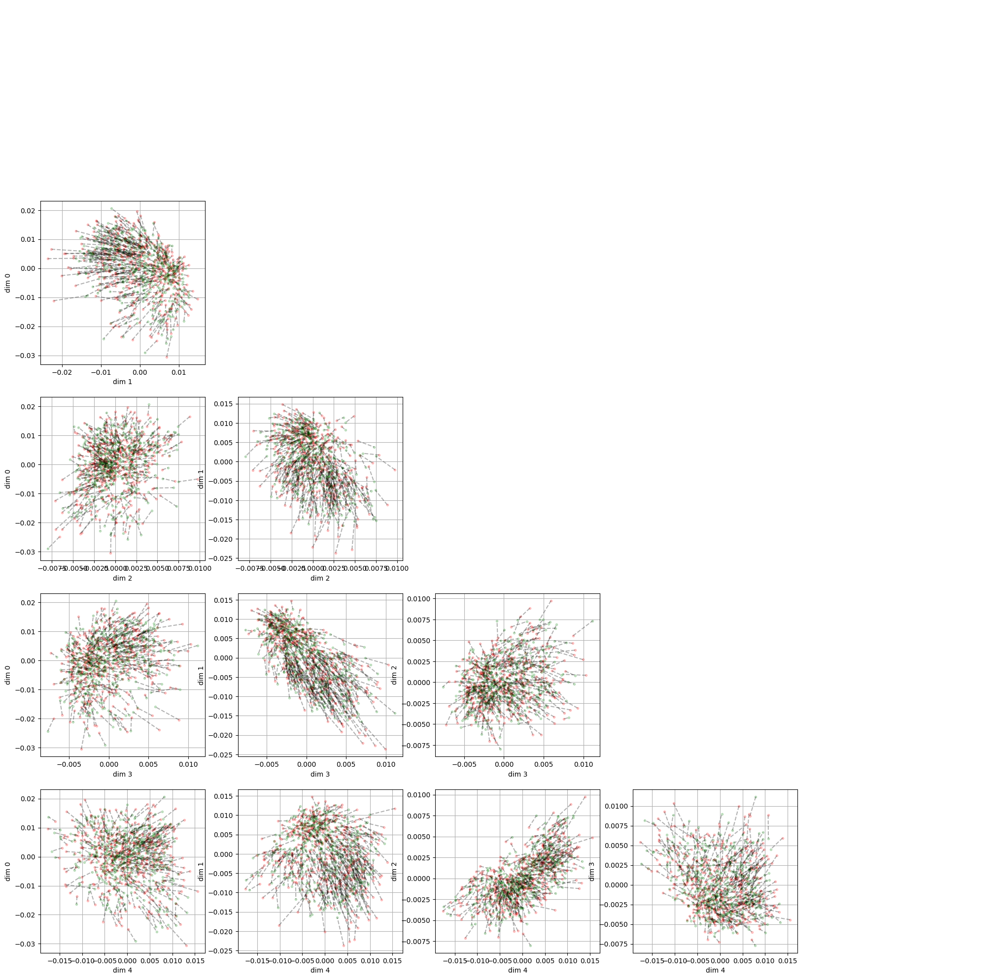

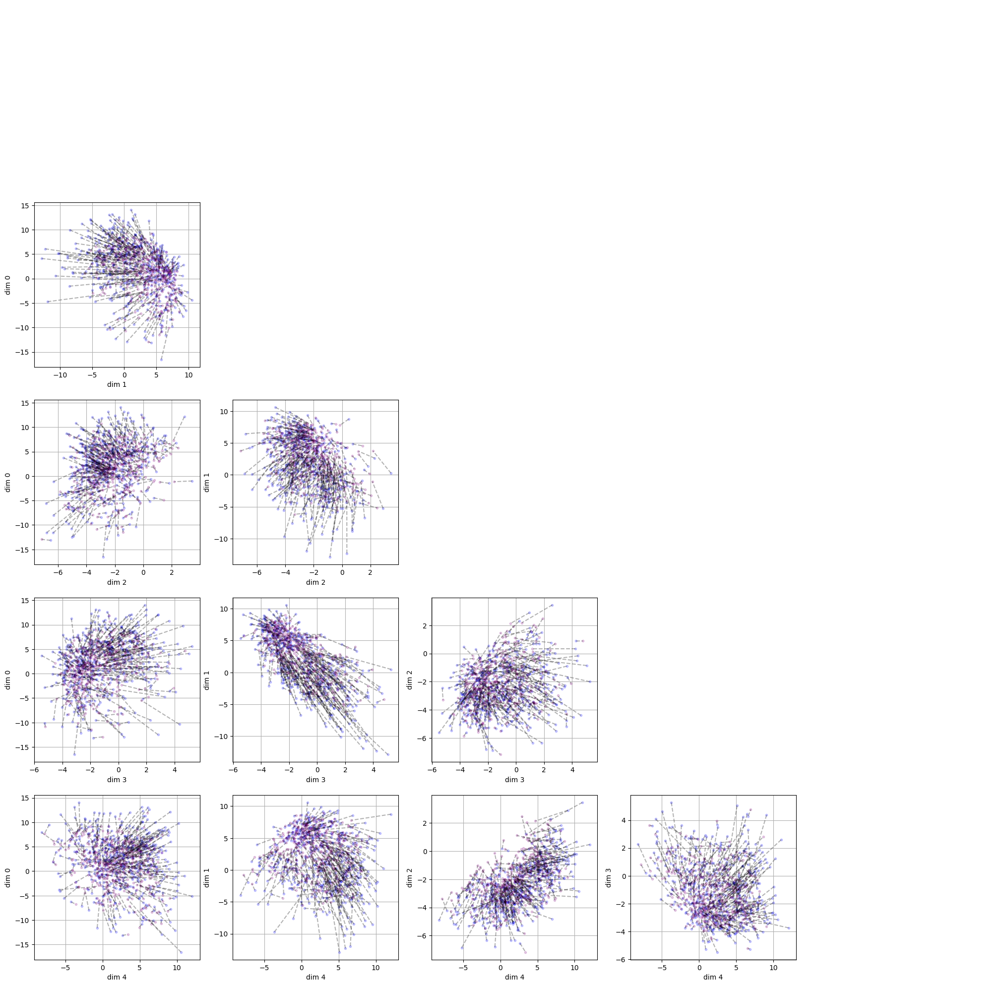

In [ ]:

alpha_pt = .4

channel_i = 0
channel_j = 1
LIST_DIM_PAIR_PLOT = [0, 1, 2, 3, 4]


z_proc_img, z_proc_noise, d = procrustes(array_z_noise[:,channel_i,:], array_z_noise[:,channel_j,:])

f.print_pairplot_align_relie(z_proc_img, z_proc_noise, 
                             LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT,
                             colx='r',
                             coly='g',
                             alpha_pt=.2,
                             alpha_lien=.3)

f.print_pairplot_align_relie(array_z_noise[:,channel_i,:], array_z_noise[:,channel_j,:], 
                             LIST_DIM_PAIR_PLOT = LIST_DIM_PAIR_PLOT,
                             colx='b',
                             coly='purple',
                             alpha_pt=.2,
                             alpha_lien=.3 )
d

### Tester alignement

In [ ]:
list_points[0].shape

(16384,)

In [ ]:
nb_pt = 200

matrice_aff_img  = f.mat_aff(array_z_noise[:,0,:],kNN = 5)
matrice_aff_img_noi = f.mat_aff(array_z_noise[:,1,:],kNN = 5)

matrice_aff_img_origine = f.mat_aff(list_points, kNN = 5)
matrice_aff_img_noise_origine = f.mat_aff(list_points_noise, kNN = 5)

(-0.5, 499.5, 499.5, -0.5)

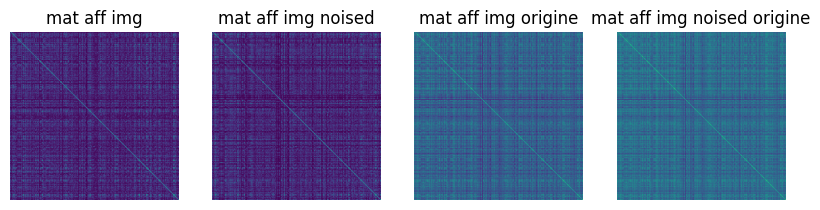

In [ ]:
n= 4
plt.figure(figsize=(10, 10*n))

plt.subplot(1,n,1)
plt.imshow(matrice_aff_img, cmap = 'viridis')
plt.title('mat aff img')
plt.axis('off')

plt.subplot(1,n,2)
plt.imshow(matrice_aff_img_noi, cmap = 'viridis')
plt.title('mat aff img noised')
plt.axis('off')

plt.subplot(1,n,3)
plt.imshow(matrice_aff_img_origine, cmap = 'viridis')
plt.title('mat aff img origine')
plt.axis('off')

plt.subplot(1,n,4)
plt.imshow(matrice_aff_img_noise_origine, cmap = 'viridis')
plt.title('mat aff img noised origine')
plt.axis('off')



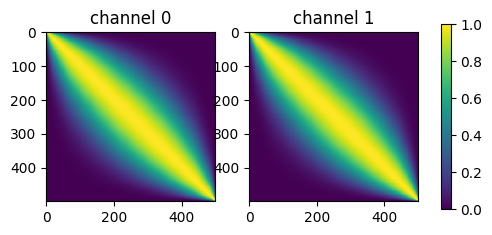

In [ ]:

x = array_z_noise[:,0,:]
# Affichage des matrices d'affinité
_, axes = plt.subplots(1, 2, figsize=(3*2,3))


for chan in [0,1]:
    plt.subplot(1, 2, chan+1)
    plt.imshow(f.mat_aff_trie(array_z_noise[:,chan,:], kNN = 5), aspect='equal', interpolation='none')
    plt.title('channel '+str(chan))
plt.colorbar(ax=axes,  shrink = 0.8)

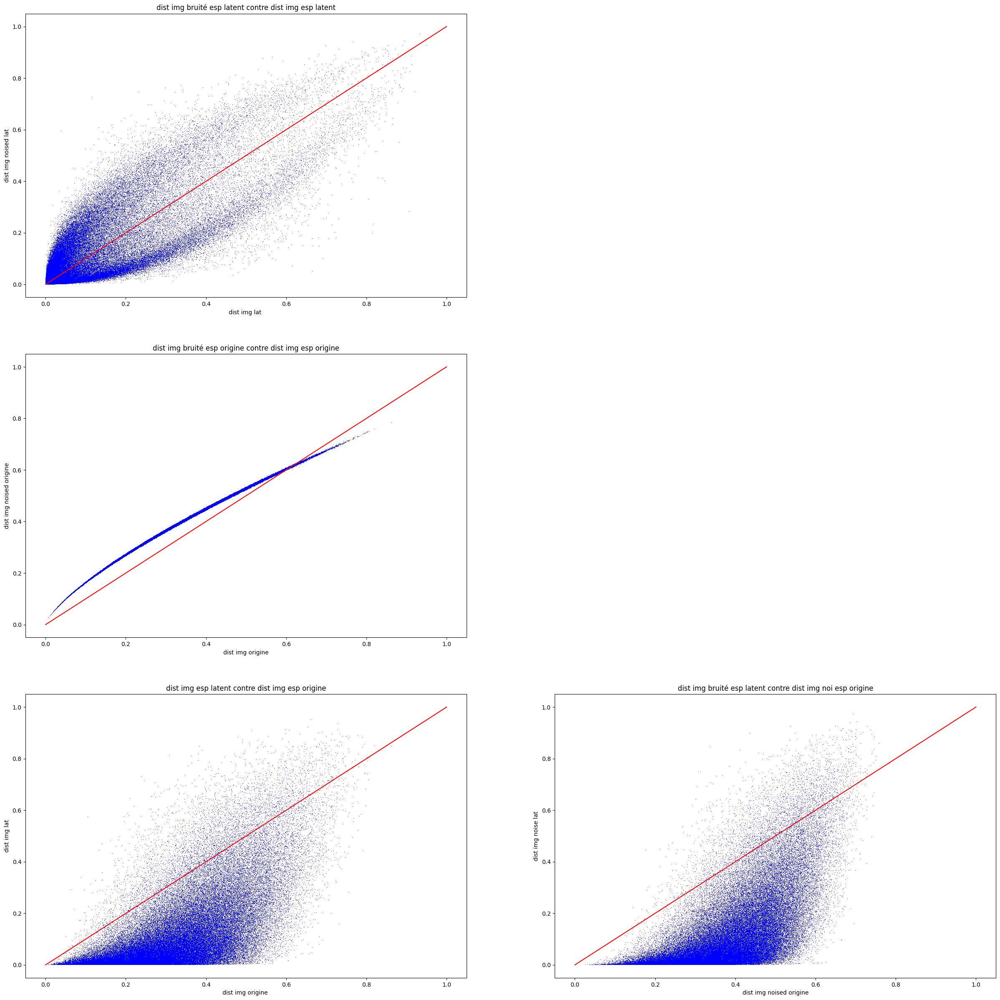

In [ ]:
nb_col = 2
nb_lig = 3
plt.figure(figsize=(10*3, 10*3))

#Z canal i contre Z canal j
plt.subplot(nb_lig,nb_col,1)
f.plot_matx_maty (matrice_aff_img, matrice_aff_img_noi, 
                title='dist img bruité esp latent contre dist img esp latent', 
                xlab = 'dist img lat ', ylab = 'dist img noised lat', color_pt = 'b')



# X canal i contre X canal j
plt.subplot(nb_lig,nb_col,3)
f.plot_matx_maty (matrice_aff_img_origine, matrice_aff_img_noise_origine, 
                title='dist img bruité esp origine contre dist img esp origine',
                xlab = 'dist img origine', ylab = 'dist img noised origine', color_pt = 'b')



#Z canal i contre X canal i
plt.subplot(nb_lig,nb_col,5)
f.plot_matx_maty (matrice_aff_img_origine, matrice_aff_img, 
                title='dist img esp latent contre dist img esp origine', 
                xlab = 'dist img origine ', ylab = 'dist img lat', color_pt = 'b')

plt.subplot(nb_lig,nb_col,6)
f.plot_matx_maty (matrice_aff_img_noise_origine, matrice_aff_img_noi, 
                title='dist img bruité esp latent contre dist img noi esp origine', 
                xlab = 'dist img noised origine', ylab = 'dist img noise lat', color_pt = 'b')





In [ ]:

matrice_dist_img  = f.mat_dist(array_z_noise[:,0,:])
matrice_dist_img_noi = f.mat_dist(array_z_noise[:,1,:])

matrice_dist_img_origine = f.mat_dist(list_points)
matrice_dist_img_noise_origine = f.mat_dist(list_points_noise)

In [ ]:
def plot_matx_maty (matx, maty, alpha = .3, title=None, xlab = ' ', ylab = ' ', color_pt = 'b', size_pt=.5, m=1):
    nb_pt = len(matx)
    for i in range(nb_pt):
        plt.scatter(matx[i], maty[i], color=color_pt, 
                    marker = ',', edgecolors='none', s=size_pt)
    plt.plot(np.linspace(0,m, 100),np.linspace(0,m, 100), color='r')
    plt.xlabel(xlab)
    plt.ylabel(ylab)
    if title is None :
        title = ylab +' contre '+xlab
    plt.title(title)

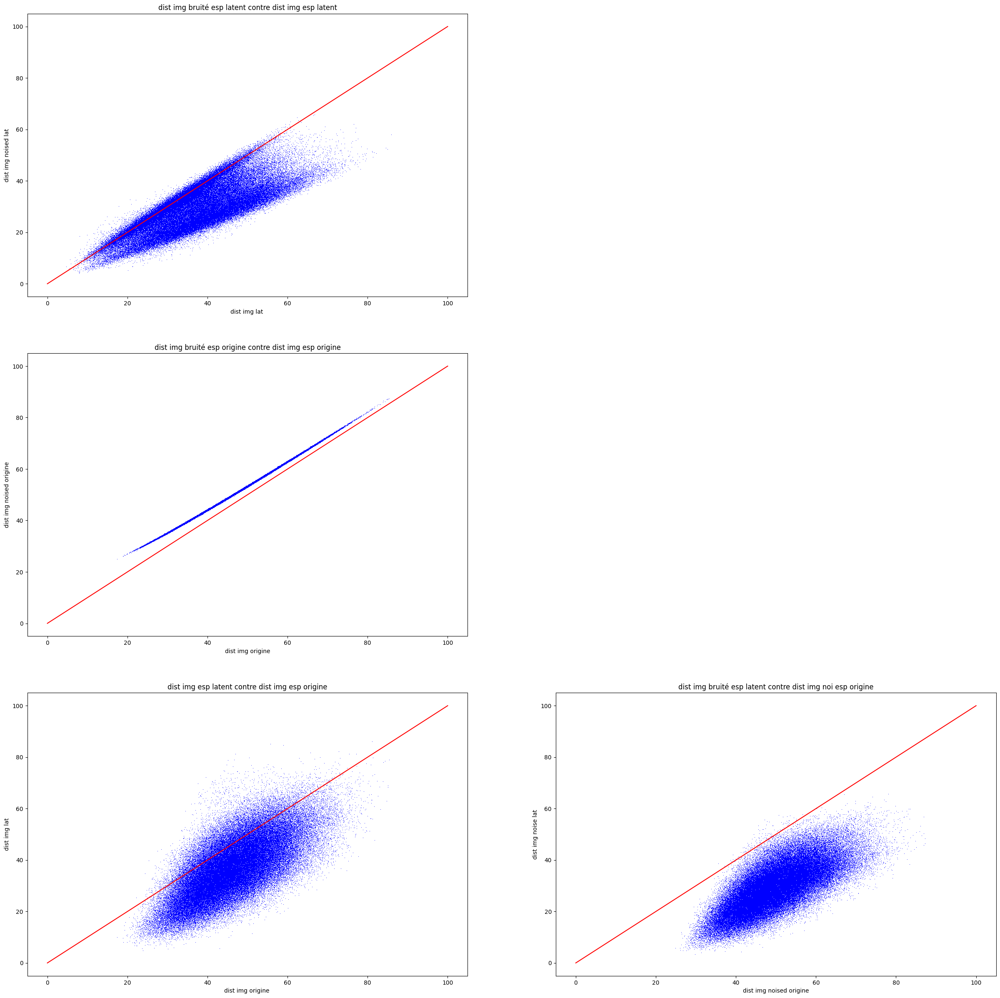

In [ ]:
nb_col = 2
nb_lig = 3
plt.figure(figsize=(10*3, 10*3))

#Z canal i contre Z canal j
plt.subplot(nb_lig,nb_col,1)
f.plot_matx_maty (matrice_dist_img, matrice_dist_img_noi, 
                title='dist img bruité esp latent contre dist img esp latent', 
                xlab = 'dist img lat ', ylab = 'dist img noised lat', color_pt = 'b', m=100)



# X canal i contre X canal j
plt.subplot(nb_lig,nb_col,3)
f.plot_matx_maty (matrice_dist_img_origine, matrice_dist_img_noise_origine, 
                title='dist img bruité esp origine contre dist img esp origine',
                xlab = 'dist img origine', ylab = 'dist img noised origine', color_pt = 'b', m=100)



#Z canal i contre X canal i
plt.subplot(nb_lig,nb_col,5)
f.plot_matx_maty (matrice_dist_img_origine, matrice_dist_img, 
                title='dist img esp latent contre dist img esp origine', 
                xlab = 'dist img origine ', ylab = 'dist img lat', color_pt = 'b', m=100)

plt.subplot(nb_lig,nb_col,6)
f.plot_matx_maty (matrice_dist_img_noise_origine, matrice_dist_img_noi, 
                title='dist img bruité esp latent contre dist img noi esp origine', 
                xlab = 'dist img noised origine', ylab = 'dist img noise lat', color_pt = 'b', m=100)





In [ ]:
def hist_mat(mat, bins=None, alpha=1, title=None):
    plt.hist(mat.reshape(mat.size), bins=bins, alpha=alpha)
    plt.title(title)
    plt.show('patch')

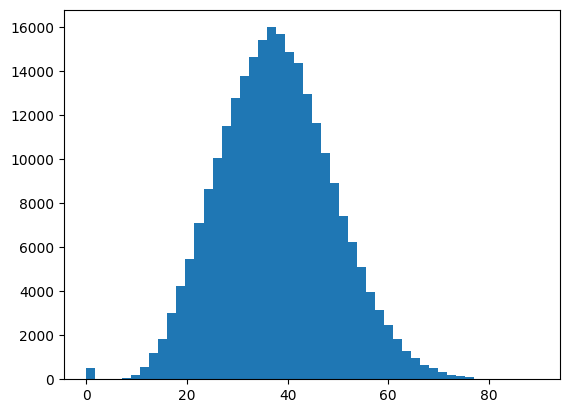

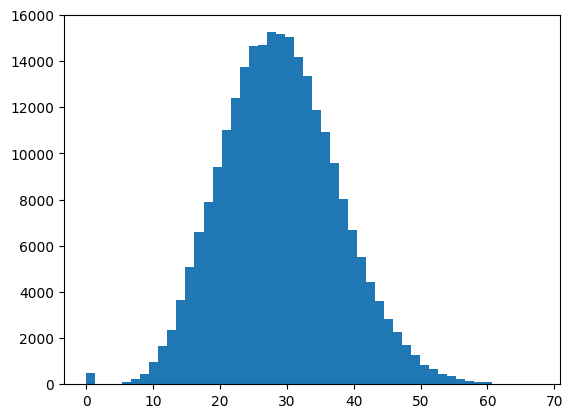

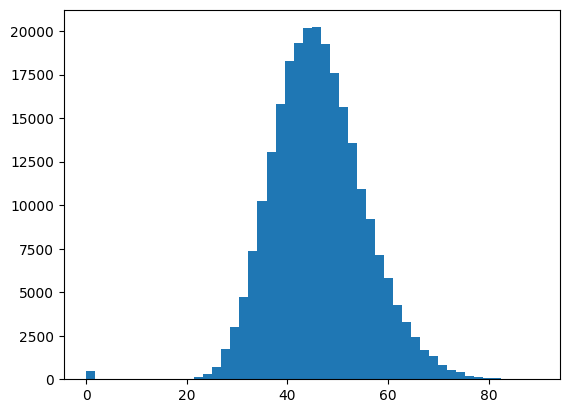

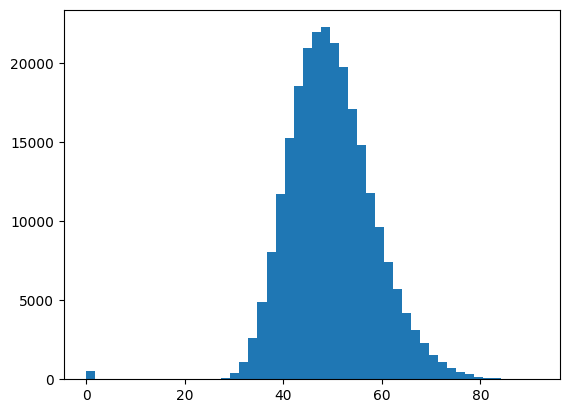

In [ ]:
list_mat = [
matrice_dist_img,
matrice_dist_img_noi,
matrice_dist_img_origine,
matrice_dist_img_noise_origine ]

for mat in list_mat : 
    hist_mat(mat, bins=50, alpha=1, title=None)

In [ ]:
def sig_mat_dist(x, kNN=5):
    N = len(x)
    # Calculer la matrice des distances (équivalent de pdist et squareform)
    tmpK = squareform(pdist(x))

    # Supprimer les diagonales (self-distances) en les remplaçant par l'infini
    tmpD = tmpK + np.diag(np.full(N, np.inf))

    # Trier les distances et prendre les k plus proches voisins (kNN)
    tmpD = np.sort(tmpD, axis=0)
    tmpB = tmpD[:kNN, :]

    # Calcul de sigma comme la moyenne des distances des k plus proches voisins
    sigma = np.mean(tmpB)

    return sigma

In [ ]:
sig_pt = sig_mat_dist(matrice_dist_img_origine, kNN=5)
sig_noise = sig_mat_dist(matrice_dist_img_noise_origine, kNN=5)

In [ ]:
print(sig_pt)
print(sig_noise)

91.19082927541652
90.05395967553731


### Laplacian eigen map

In [ ]:
X = [np.array(el[0].flatten()) for el in list_points]
X = [np.random.rand(10) for _ in range(200)]

In [ ]:
X[0].shape

(10,)

In [ ]:
LAT_DIM = 32
Z_lap = SpectralEmbedding(n_components=LAT_DIM).fit_transform(X)

Z_lap.shape

(200, 32)

In [ ]:
array_z_noise[:,0,:].shape

(500, 64)

In [ ]:
mat_aff_z_lap = f.mat_dist(Z_lap)
mat_aff_x_lap = f.mat_dist(X)

print(mat_aff_x_lap.shape)
print(mat_aff_z_lap.shape)

(200, 200)
(200, 200)


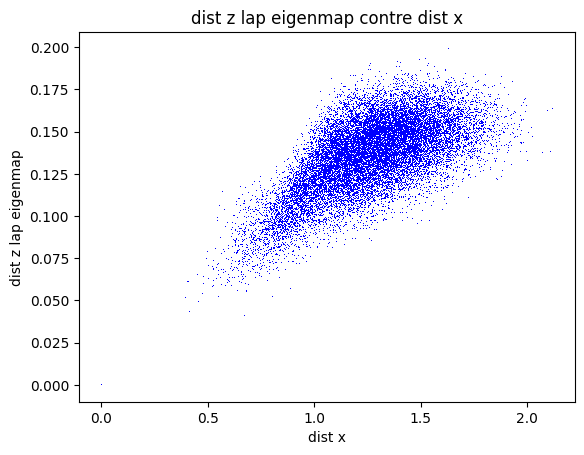

In [ ]:
f.plot_matx_maty(mat_aff_x_lap, mat_aff_z_lap, diag=False, xlab='dist x', ylab='dist z lap eigenmap')

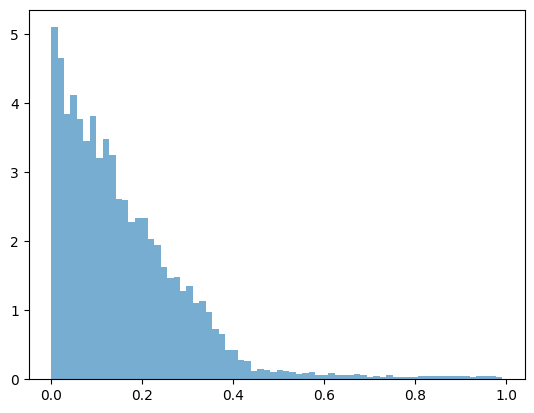

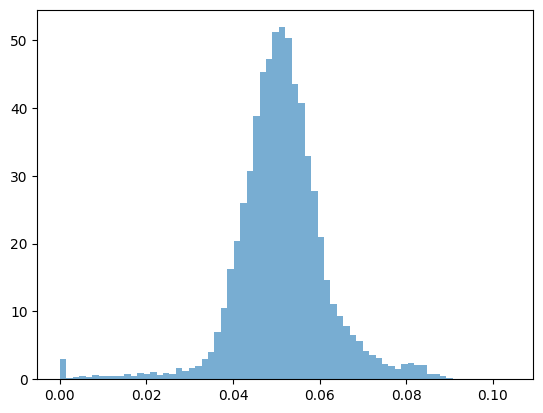

In [ ]:
# plot_matx_maty(mat_aff_x_lap, mat_aff_z_lap, ylab='Z_lap', xlab='pt origine', diag=False)
# plt.show()

l1 = mat_aff_x_lap.reshape(mat_aff_x_lap.size)
l2 = mat_aff_z_lap.reshape(mat_aff_z_lap.size)
plt.hist(l1, density=True, alpha=.6, bins=70)
plt.show('patches')
plt.hist(l2, density=True, alpha=.6, bins=70)
plt.show('patches')

### Meilleur vs Pire

In [ ]:
def list_losses(data = test_dataset, 
                model = model_loaded, 
                n_fil_in = 1, nb_pt = None):
    loss = model.loss_function
    l = []
    # for el in data:
    #     Y = f.get_data(el).to(DEVICE)
    #     Y_tensor = torch.Tensor.reshape(Y, shape= (1, n_fil_in, size_img_1, size_img_2))
    #     pt_loss = loss(model.forward(Y_tensor))['total'].mean()
    #     l.append(pt_loss)
    #     del Y, Y_tensor, pt_loss
    # return l
    if nb_pt is None : 
        nb_pt = len(data)
    for i in range(nb_pt):
        Y = f.get_data(data[i]).to(DEVICE)
        Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, n_fil_in , *Shape_c_1))
        pt_loss = loss(model.forward(Y_tensor))['total'].mean().item()
        l.append(pt_loss)
        del Y, Y_tensor, pt_loss
    return l

def best_recons(data = test_dataset, data_land = None, model = model_loaded, n_fil_in = 1):
    loss = model.loss_function
    
    #initialisation 
    Y = f.get_data(data[0]).to(DEVICE)
    Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, n_fil_in , *Shape_c_1))
    frw = model.forward(Y_tensor)
    pt_loss = loss(frw)['total'].mean().item()
    l = pt_loss
    
    for el in data:
        Y = f.get_data(el).to(DEVICE)
        Y_tensor = torch.Tensor.reshape(Y, shape= (N_CHANNELS, n_fil_in , *Shape_c_1))
        frw = model.forward(Y_tensor)
        pt_loss = loss(frw)['total'].mean().item()
        if pt_loss < l :
            l = pt_loss
            point = el
        del Y, Y_tensor, frw, pt_loss
    recons = reconstruction_image_bw_land(point)
    if data_land is not None:
        recons_land = reconstruction_land(point)
    else : 
        recons_land = 'not demanded'
    ret = {'el' : point,
           'recons': recons,
           'recons_land': recons_land}
    return ret


def best_and_worst_recons(data = test_dataset, 
                          model = model_loaded,n = 5, 
                          n_fil_in = 1, 
                          data_land = None,
                          list_loss = None):
    if list_loss is None : 
        indexed_l = list(enumerate(list_losses(data = test_dataset, 
                                               model = model, 
                                               n_fil_in = n_fil_in)))
    else : 
        indexed_l = list(enumerate(list_loss))
    sorted_indexed_l = sorted(indexed_l, key=lambda x: x[1], reverse=False)
    
    #on récupère les indices puis les reconstrutions des n meilleurs : loss les plus petites
    top_best_n_indices = [i for i, _ in sorted_indexed_l[:n]]
    list_recons_best = []
    list_recons_best_land = []
    for i in top_best_n_indices:
        list_recons_best.append(reconstruction_image_bw_land(data[i]))
        if data_land is not None : 
            list_recons_best_land.append(reconstruction_land(data_land[i]))


    #on récupère les indices puis les reconstrutions des n pires : loss les plus grandes
    top_worst_n_indices = [i for i, _ in sorted_indexed_l[-n:]]
    list_recons_worst = []
    list_recons_worst_land = []
    for i in top_worst_n_indices:
        list_recons_worst.append(reconstruction_image_bw_land(data[i]))
        if data_land is not None : 
            list_recons_worst_land.append(reconstruction_land(data_land[i]))
    ret = {
        'best' : list_recons_best,
        'worst' :  list_recons_worst,
        'list_indice_best' : top_best_n_indices,
        'list_indice_worst' : top_worst_n_indices,
        'best_land' : list_recons_best_land,
        'worst_land' :  list_recons_worst_land,
    }

    return ret




In [ ]:
list_loss = list_losses(data = test_dataset, 
                        model = model_loaded,
                        n_fil_in=1,
                        nb_pt = None) 


C:\Users\salvador\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\torchvision\transforms\functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


min : 0.06939079612493515
max : 1.5861457586288452
moyenne : 0.25370030597700943
------
quantile 0.25 : 0.17695897072553635
quantile 0.5 : 0.22381440550088882
quantile 0.75 : 0.29288504272699356
------
moyenne norm : 0.1161996045126407
quantile 0.25 : 0.06781733268548362
quantile 0.5 : 0.09735776711305917
quantile 0.75 : 0.14090397769953977


Text(0.5, 1.0, 'losses on the test dataset MC-VAE img//img noised')

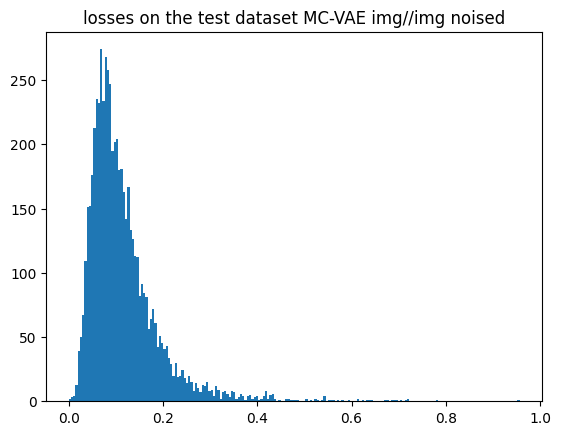

In [ ]:
l_norm = info_list(list_loss, ret_norm =True)
plt.hist(l_norm, bins=200)
plt.title('losses on the test dataset MC-VAE img//img noised')

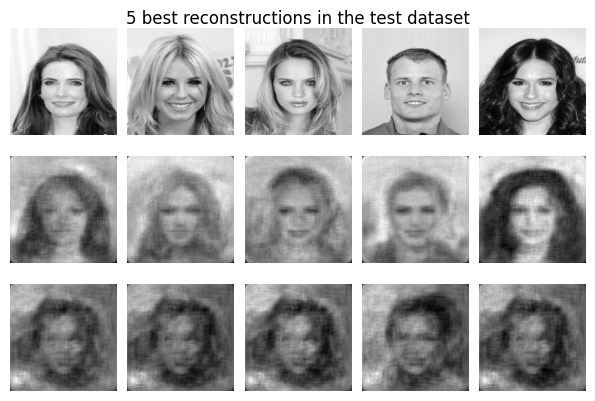

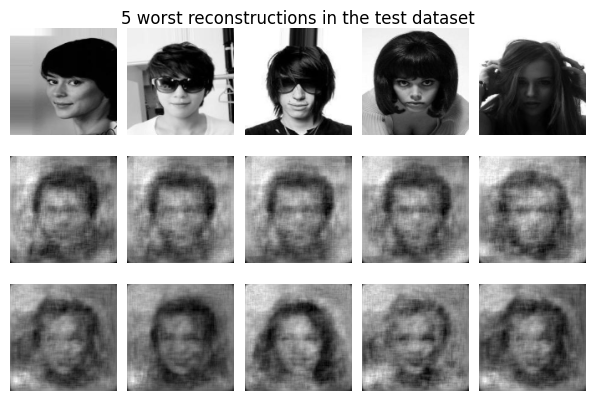

In [ ]:
N = 5

b_and_w_recons = best_and_worst_recons(data = test_dataset, 
                                       model = model_loaded,
                                       data_land = selected_dataset_land_bin,
                                       n = N, 
                                       n_fil_in = 1, 
                                       list_loss = list_loss)
dict  = b_and_w_recons
b_recons =  dict['best']
w_recons =  dict['worst']
b_recons_land =  dict['best_land']
w_recons_land =  dict['worst_land']
ind_b_recons =  dict['list_indice_best']
ind_w_recons =  dict['list_indice_worst']


for i in range(N):
    plt.subplot(3, N, i+1)
    f.plot_img_bw(test_dataset[ind_b_recons[i]][0])

    plt.subplot(3, N, N+i+1)
    f.plot_img_bw(b_recons[i])

    plt.subplot(3, N, 2*N+i+1)
    f.plot_img_bw(b_recons_land[i])
    
plt.suptitle(str(N)+' best reconstructions in the test dataset', 
                verticalalignment = 'bottom', )
# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=1, bottom=0.2, wspace=0.1, hspace=0)
plt.show()


for i in range(N):
    plt.subplot(3, N, i+1)
    f.plot_img_bw(test_dataset[ind_w_recons[i]][0])

    plt.subplot(3, N, N+i+1)
    f.plot_img_bw(w_recons[i])

    
    plt.subplot(3, N, 2*N+i+1)
    f.plot_img_bw(w_recons_land[i])
    
plt.suptitle(str(N)+' worst reconstructions in the test dataset', 
                verticalalignment = 'bottom', )

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.05, right=0.95, top=1, bottom=0.2, wspace=0.1, hspace=0)

In [ ]:
LIST_DIM_PAIR_PLOT=[0,1,2,3,4,5]
N = 20

b_and_w_recons = best_and_worst_recons(data = test_dataset,
                                        model = model_loaded,
                                        n = N, 
                                        n_fil_in = 1, 
                                        list_loss = list_loss)
dict  = b_and_w_recons
ind_b_recons =  dict['list_indice_best']
ind_w_recons =  dict['list_indice_worst']

best_points_bw = calcul_points_pairplot_mccvae(list_ind_point = ind_b_recons, 
                                     mod = model_loaded, 
                                     data = test_dataset)

worst_points_bw = calcul_points_pairplot_mccvae(list_ind_point = ind_w_recons, 
                                     mod = model_loaded, 
                                     data = test_dataset)

IndexError: index 2 is out of bounds for axis 1 with size 2

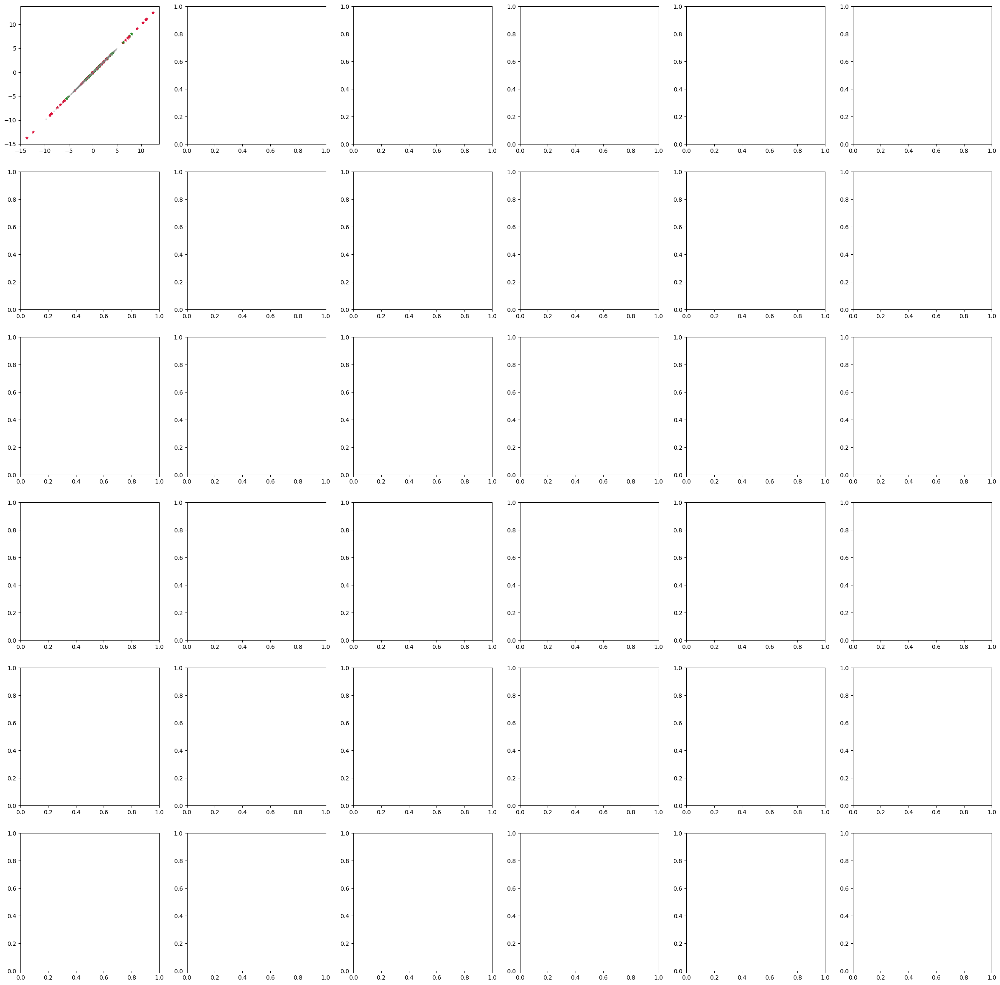

In [ ]:
f.print_pairplot_mcvae(array_z, LIST_DIM_PAIR_PLOT, 
               best_points=best_points_bw, 
               col_best = 'forestgreen',
               worst_points=worst_points_bw,
               col_worst = 'crimson',
               alpha = 0.2)

# Ajuster l'espace entre les subplots
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

## MC VAE Image/landmarks (CNN/MLP)

### Paramètres

In [ ]:
N_EPOCHS = 500
BATCH_SIZE = 32
LR = 1e-4           # Learning rate
LAT_DIM = 512        # Size of the latent space for this autoencoder
BETA =  0.001         # balance parameter between ll and kl losses loss = beta*kl - ll
N_CHANNELS = 2

DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
print('Device:', DEVICE)
VAE_CLASSES = [ConvVAE, ThreeLayersVAE] # Architecture of the autoencoder (VAE: three layers of convolution and one linear)
DEVICE = 'cpu'
Shape_c_1 = (3, size_img_1, size_img_2) # Number of pixels in an CaelebA image after reshape
Shape_c_2 = (1,10,1) #vecteur de landmarks

dummy_data = [torch.zeros(Shape_c_1).to(DEVICE), torch.zeros( Shape_c_2).to(DEVICE)]  # Dummy data to initialize the input layer size


model_land = Mcvae(data=dummy_data, 
              n_channels=N_CHANNELS,
              n_feats = (Shape_c_1, Shape_c_2), 
              lat_dim=LAT_DIM, 
              vaeclass=VAE_CLASSES,
              beta = BETA).to(DEVICE) # channel 1 : image, channel 2 : image binaire des landmarks
model_land.optimizer = torch.optim.Adam(params=model_land.parameters(), lr=LR)
model_land.init_loss()
model_land.init_validation_loss()


# Charger le dataset en filtrant les images selon les indices sélectionnés
selected_dataset = CustomImageLandmarksDataset(image_paths, landmarks[selected_indices], transform=transforms.ToTensor())
selected_dataset_img = CustomImageDataset(image_paths, transform)

# Diviser le Subset en ensembles d'entraînement et de test (70%  train,  20% validation,  10% test)
train_size = int(0.7 * len(selected_dataset))
valid_size = int(0.2 * len(selected_dataset))
test_size = len(selected_dataset) - train_size - valid_size
train_dataset, valid_dataset, test_dataset = random_split(selected_dataset, [train_size, valid_size, test_size])

# Utiliser un DataLoader pour charger les données en lots
train_data_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
test_data_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

Device: cuda


In [ ]:
train_dataset[0].shape

torch.Size([3, 128, 128])

### Entrainement


In [ ]:
# Entrainement du modèle

init_params = model_land.state_dict()
# Load data in the form of a tensor
#train data
X = f.get_data(train_dataset)#.to(DEVICE)
print(type(X))
# print(type(torch.from_numpy(np.array(X))))
model_land.data = X #torch.Tensor.reshape(X, shape= (N_CHANNELS, BATCH_SIZE, 1, *Shape_c_1, *Shape_c_2))

#validation data
Y = f.get_data(train_dataset)#.to(DEVICE)
valid_data_tensor = Y #torch.Tensor.reshape(Y, shape= (N_CHANNELS, BATCH_SIZE, 1, size_img_1, size_img_2))

writer = SummaryWriter()
# Load  parameters and train
model_land.load_state_dict(init_params)
model_land.optimize(epochs=N_EPOCHS, data=model_land.data, validation_data = valid_data_tensor)

<class 'list'>


RuntimeError: mat1 and mat2 shapes cannot be multiplied (32x119808 and 25088x512)